In [4]:
np.save(os.path.join(s2p_base_dir,subject,fov,session,'mean_fov_trace.npy'),data_dict[session]['mean_FOV'])

No module named 'cellpose'
cannot use anatomical mode, but otherwise suite2p will run normally
0% discarded due to f0 rundown
BCI_26-040522-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-040622-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-040722-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-040822-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-040822_2-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-040922-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041022-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041122-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041222-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041222_2-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041322-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041322_2-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041422-FOV_04.npy
0% discarded due to f0 rundown
BCI_26-041522-FOV_04.npy
7
53
59
20
5
31
15
21
16
145
36
87
162
334


/tmp/ipykernel_22104/822597281.py:60: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_22104/822597281.py:61: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_22104/822597281.py:62: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


0% discarded due to f0 rundown
BCI_60-070323-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-070523-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-070623-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-070723-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-071023-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-071123-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-071223-FOV_01.npy
0% discarded due to f0 rundown
BCI_60-071323-FOV_01.npy
30
16
72
17
32
153
3
24


/tmp/ipykernel_22104/822597281.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig_fft = plt.figure(figsize = [15,15])


0% discarded due to f0 rundown
BCI_29-041922-FOV_01.npy
0% discarded due to f0 rundown
BCI_29-042022-FOV_01.npy
0% discarded due to f0 rundown
BCI_29-042122-FOV_01.npy
0% discarded due to f0 rundown
BCI_29-042222-FOV_01.npy
136
136
7
24
0% discarded due to f0 rundown
BCI_65-072123-FOV_01.npy
0% discarded due to f0 rundown
BCI_65-072223-FOV_01.npy
0% discarded due to f0 rundown
BCI_65-072323-FOV_01.npy
29
31
10


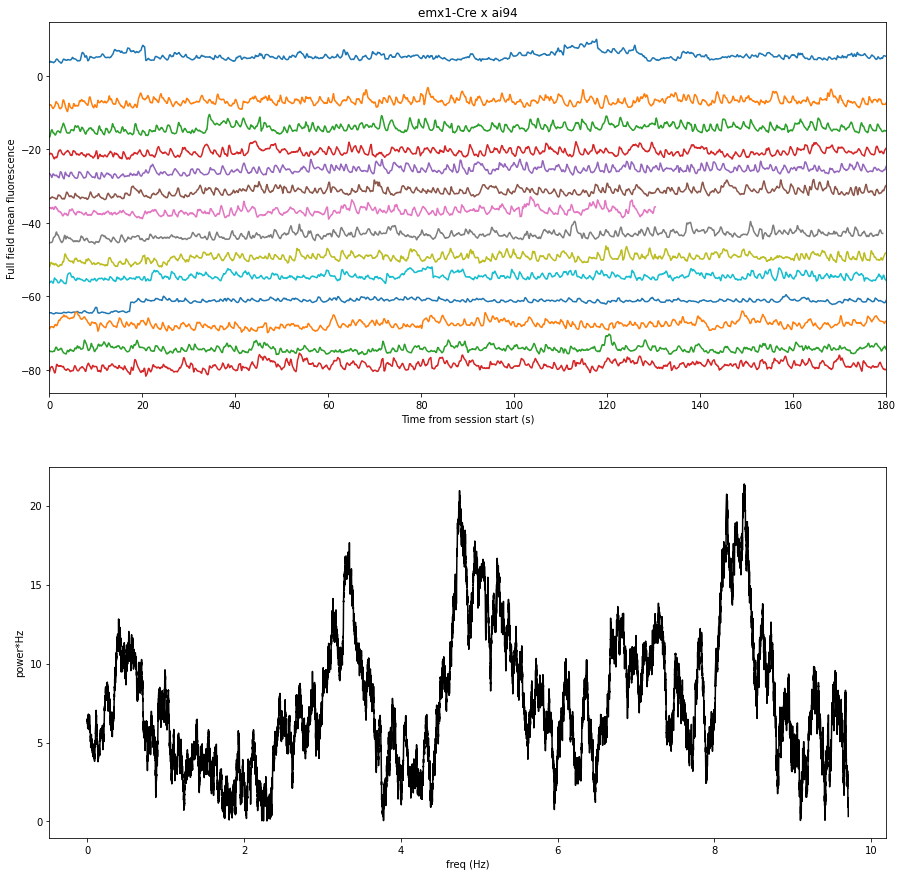

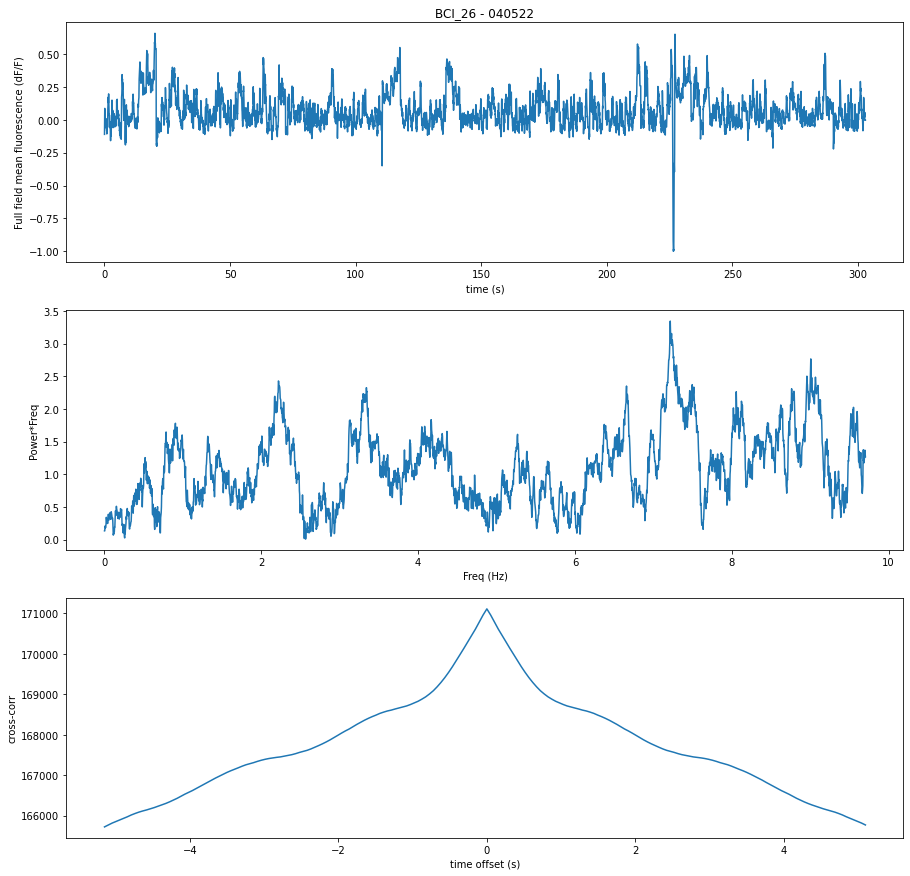

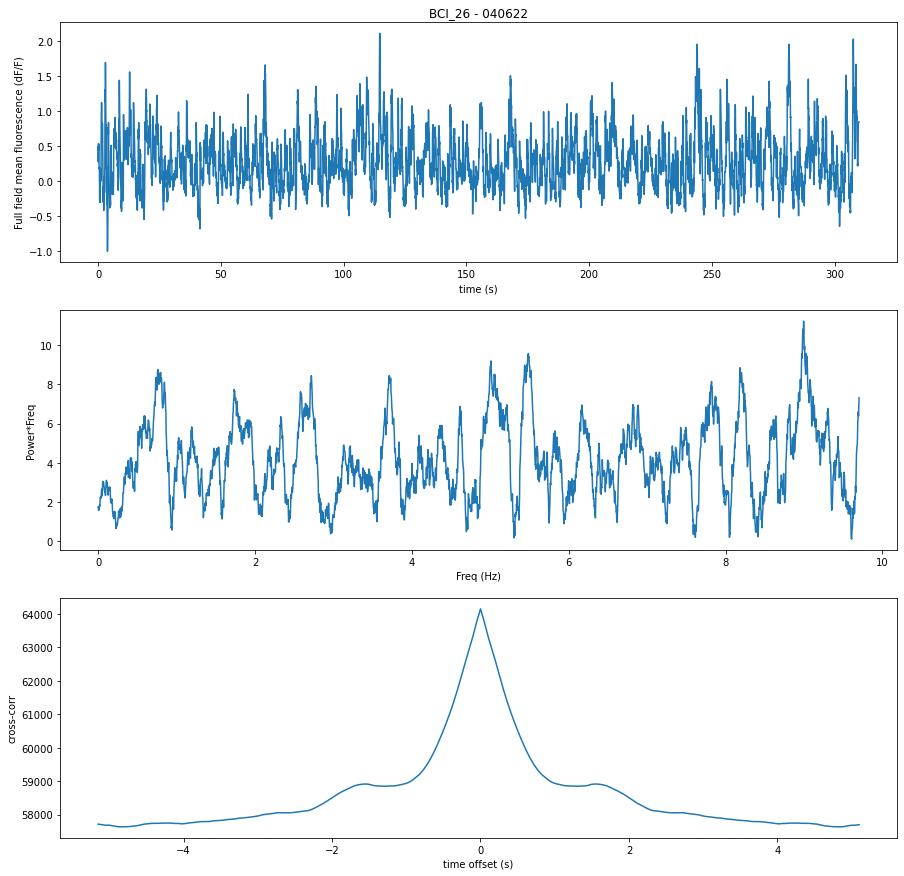

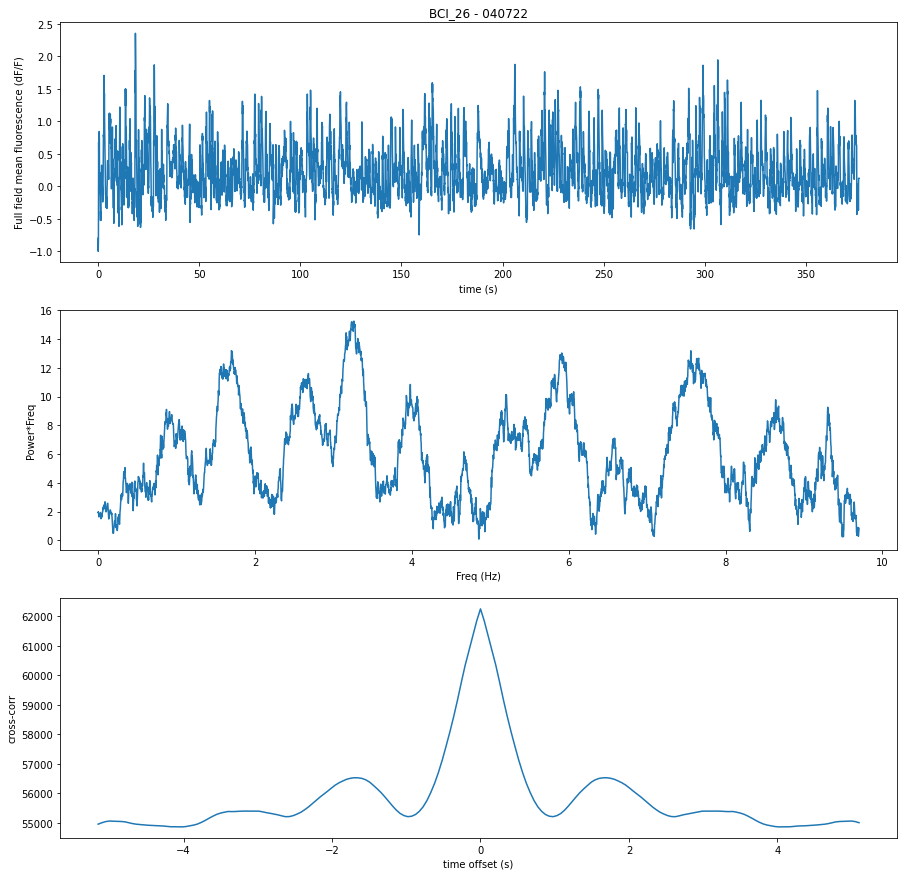

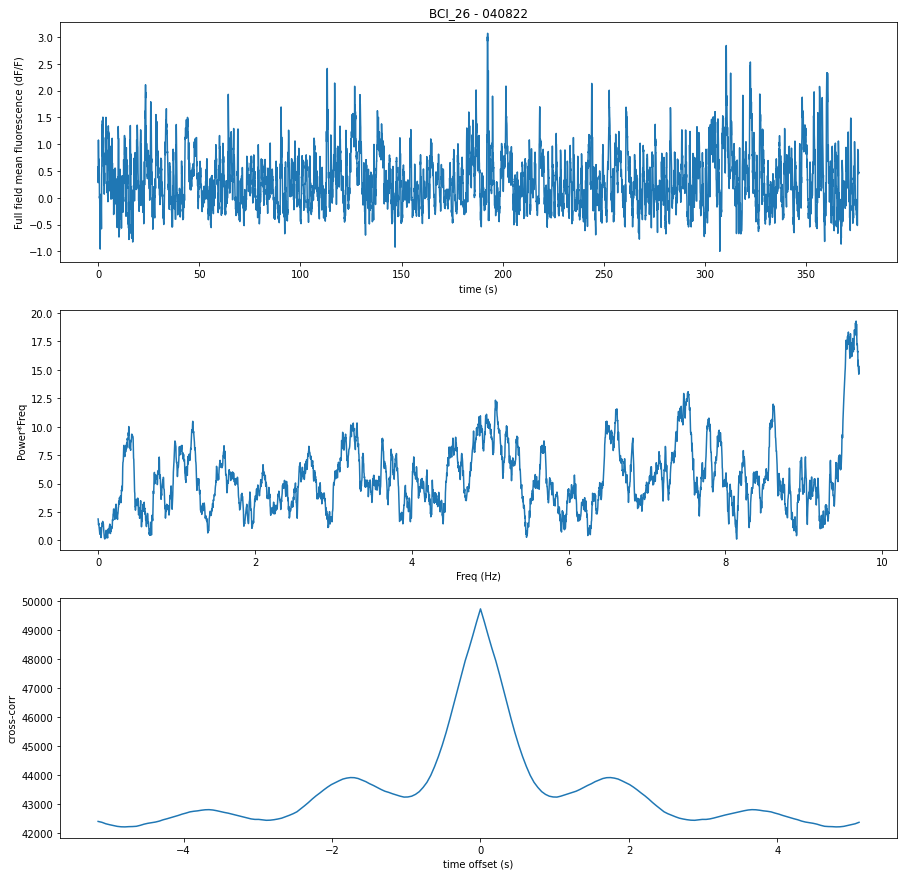

...

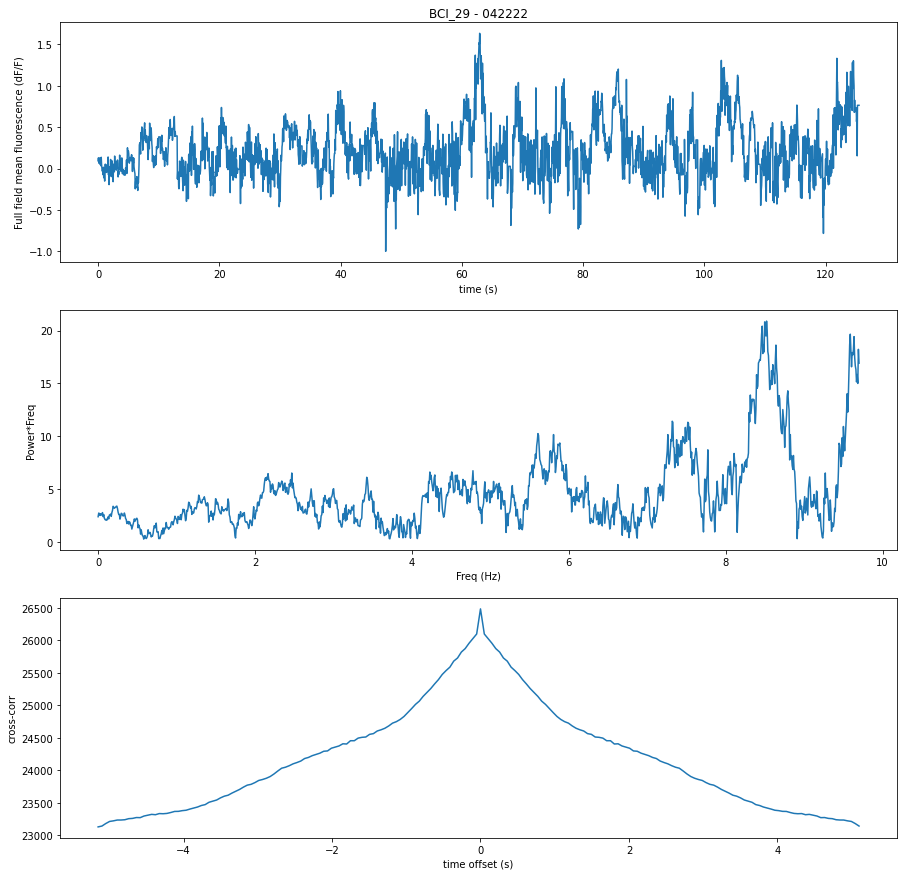

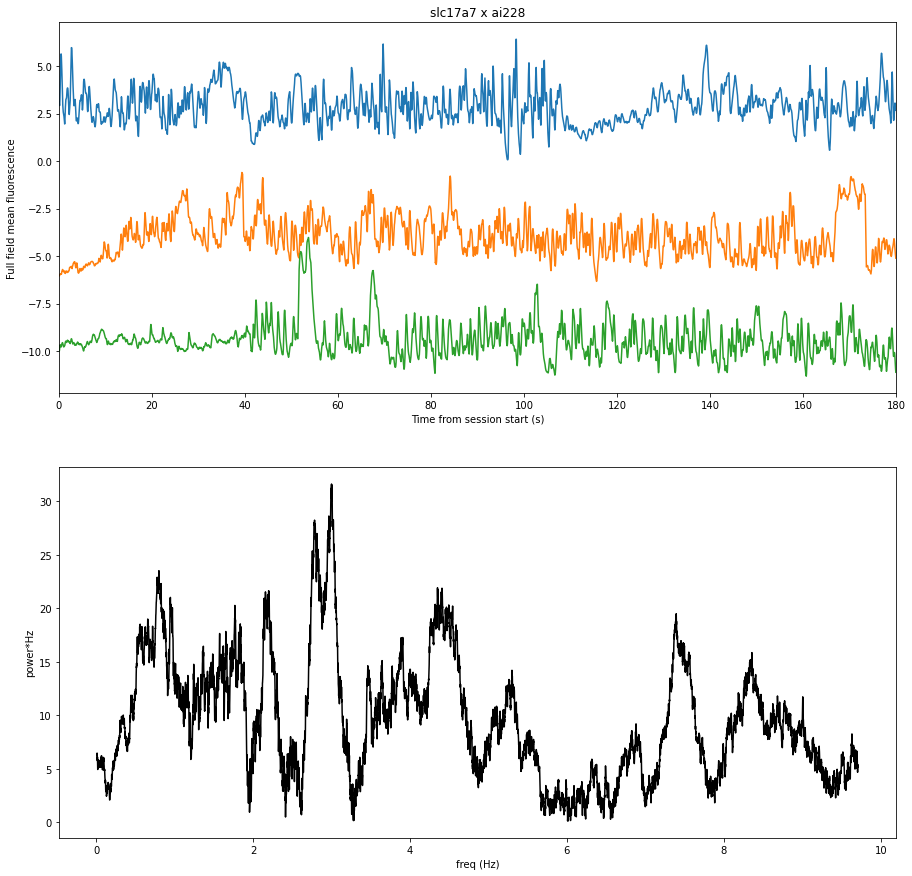

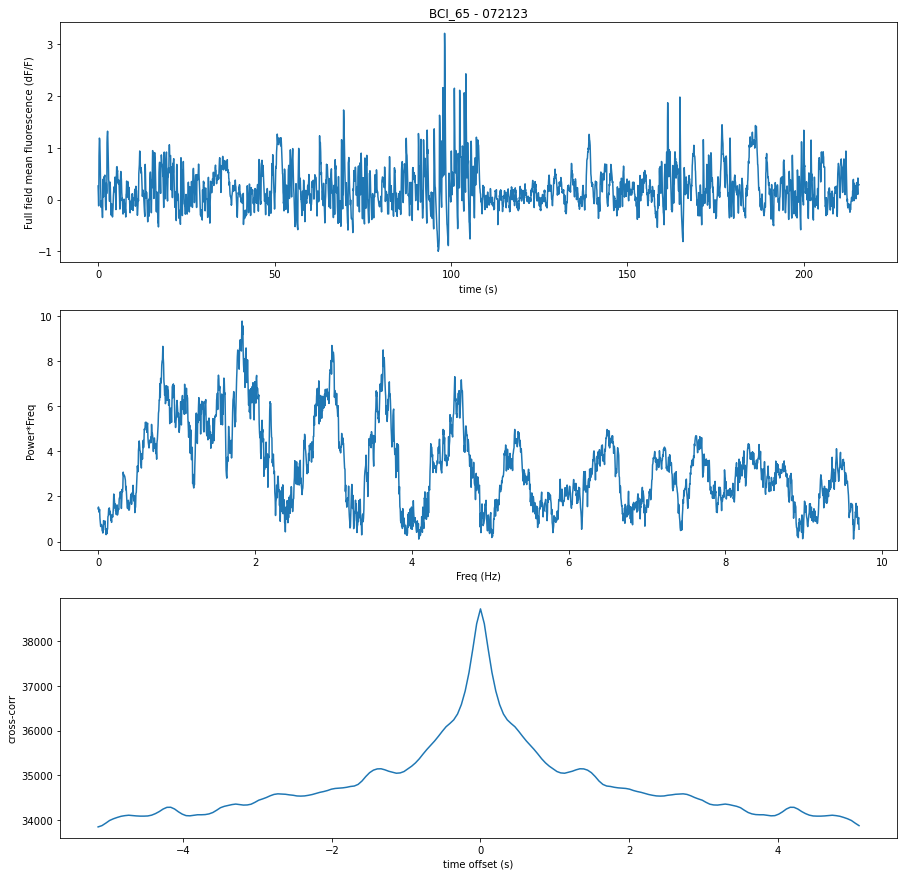

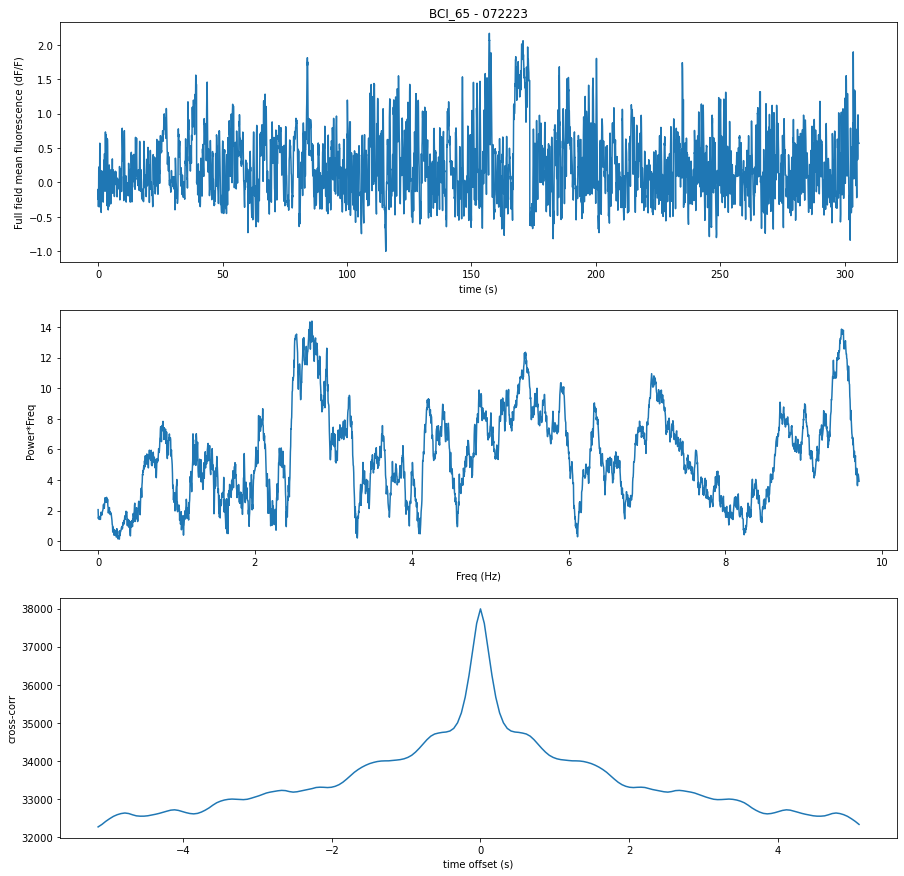

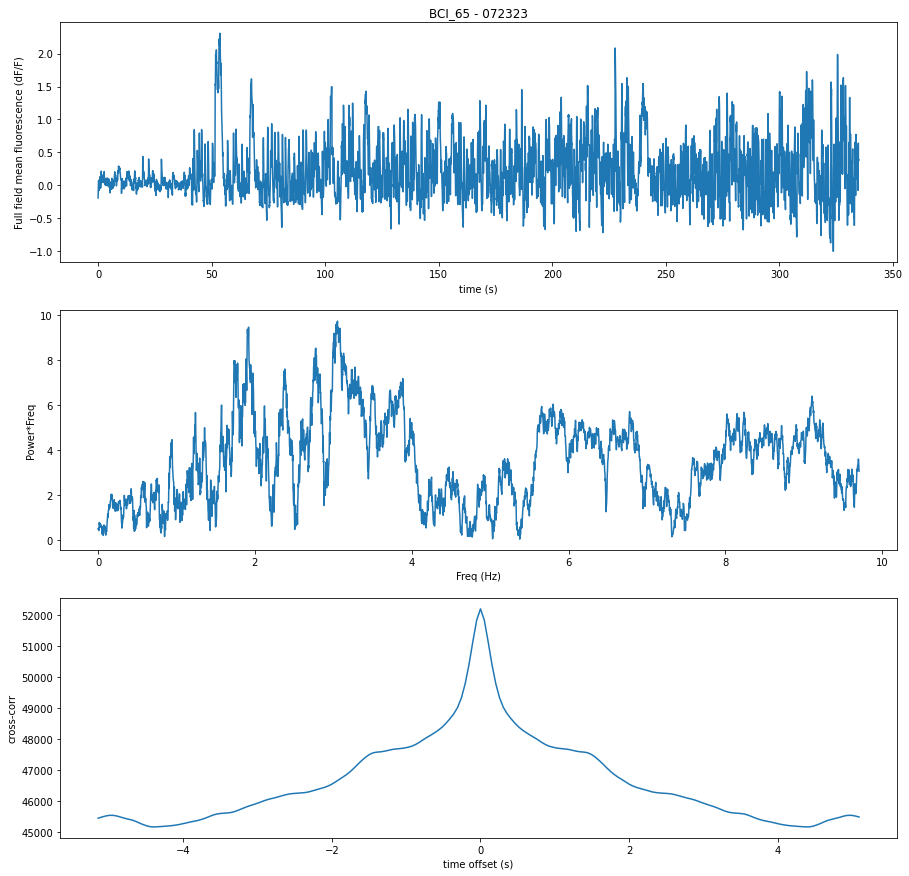

In [2]:
#%% suggest neurons for next session based on previous sessions
import os
import BCI_analysis
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from scipy.io import savemat
from scipy.stats import zscore
import shutil
import matplotlib.pyplot as plt

import suite2p
BinaryFile = suite2p.io.BinaryFile

use_scalar_f0 = False

sessionwise_base_dir = '/home/jupyter/bucket/Data/Calcium_imaging/sessionwise_tba'
s2p_base_dir = '/home/jupyter/bucket/Data/Calcium_imaging/suite2p/Bergamo-2P-Photostim'
raw_scanimage_dir = '/home/jupyter/bucket/Data/Calcium_imaging/raw/Bergamo-2P-Photostim'
bpod_path = '/home/jupyter/bucket/Data/Behavior/BCI_exported/Bergamo-2P-Photostim/'

#next_session_dir = '/home/jupyter/bucket/Data/Calcium_imaging/next_session'

maximum_decrease_in_f0 = .25 # if decreases above this amount will be thrown out
ignore_rundown = True
step_back = 60
step_forward = 300

# 2 neuron stuff
# subject = 'BCI_41'
# fov = 'FOV_02'
# subject = 'BCI_42'
# fov = 'FOV_04'
# subject = 'BCI_43'
# fov = 'FOV_02'
# 2 neuron stuff

subject = 'BCI_26' #emx1-cre x ai94
fov = 'FOV_04'

# subject = 'BCI_60' #slc17a7 x ai229
# fov = 'FOV_01'


# subject = 'BCI_29' # teto6s
# fov = 'FOV_01'

# subject = 'BCI_65' # teto6s
# fov = 'FOV_01'

fovs = ['FOV_04','FOV_01','FOV_01','FOV_01']
subjects = ['BCI_26','BCI_60','BCI_29','BCI_65']
genotypes = ['emx1-Cre x ai94','slc17a7 x ai229','camkiiaTTA x teto6s','slc17a7 x ai228']
for subject, fov,genotype in zip(subjects,fovs,genotypes): # just for generating the FOV traces
    use_red_channel = False
    load_neuropil= True
    load_mean_FOV = True
    next_session_dir = '/home/jupyter/bucket/Data/Calcium_imaging/next_session/{}-{}/'.format(subject, fov)
    files = os.listdir(os.path.join(sessionwise_base_dir,subject))
    data_dict = {}
    sessions = []
    stat = np.load(os.path.join(s2p_base_dir,subject,fov,'stat.npy'),allow_pickle=True).tolist()
    stat_rest = np.load(os.path.join(s2p_base_dir,subject,fov,'stat_rest.npy'),allow_pickle=True).tolist()
    for file in files: ### NOT ALL FILES?? - 

        if fov in file:
            session = file[len(subject)+1:-1*(len(fov)+5)]
            sessions.append(session)
            data_dict[session] = BCI_analysis.io_python.read_sessionwise_npy(os.path.join(sessionwise_base_dir,subject,file))
            meanimages = np.load(os.path.join(s2p_base_dir,subject,fov,'session_mean_images.npy'),allow_pickle = True).tolist()
            data_dict[session]['mean_image'] =  meanimages[session]['meanImg']
            data_dict[session]['max_image'] =  meanimages[session]['maxImg']
            F0 = np.load(os.path.join(s2p_base_dir,subject,fov,session,'F0.npy'))
            if load_neuropil:
                Fneu = np.load(os.path.join(s2p_base_dir,subject,fov,session,'Fneu.npy'))
                data_dict[session]['Fneu'] = Fneu   
            if load_mean_FOV:
                try: 
                    data_dict[session]['mean_FOV'] = np.load(os.path.join(s2p_base_dir,subject,fov,session,'mean_fov_trace.npy'))
                except:
                    ops =  np.load(os.path.join(s2p_base_dir,subject,fov,session,'ops.npy'),allow_pickle = True).tolist()
                    binaryfile = os.path.join(s2p_base_dir,subject,fov,session,'data.bin')
                    with BinaryFile(Ly=ops['Ly'], Lx=ops['Lx'], read_filename=binaryfile) as f:   
                        FOV_mean_list = []
                        for f_ in f.iter_frames():
                            FOV_mean_list.append(np.mean(f_[1]))
                    data_dict[session]['mean_FOV']= np.asarray(FOV_mean_list)
                    np.save(os.path.join(s2p_base_dir,subject,fov,session,'mean_fov_trace.npy'),data_dict[session]['mean_FOV'])




            if use_red_channel:
                F = np.load(os.path.join(s2p_base_dir,subject,fov,session,'F_chan2.npy'))
                data_dict[session]['F_sessionwise'] =  F
                dff = (F-F0)/F0
                data_dict[session]['dff_sessionwise'] = dff


            if any(np.nanmean(F0/np.nanmedian(F0[:,:10000],1)[:,np.newaxis],0)<1-maximum_decrease_in_f0):
                throw_out_idx = np.where(np.nanmean(F0/np.nanmedian(F0[:,:10000],1)[:,np.newaxis],0)<1-maximum_decrease_in_f0)[0][0]
            else:
                throw_out_idx = data_dict[session]['dff_sessionwise'].shape[1]
            throw_out_idx = data_dict[session]['dff_sessionwise'].shape[1]
            print('{}% discarded due to f0 rundown'.format(round(100*(1-(throw_out_idx/data_dict[session]['dff_sessionwise'].shape[1])))))
            data_dict[session]['F_sessionwise'] = data_dict[session]['F_sessionwise'][:,:throw_out_idx]
            if ignore_rundown:
                data_dict[session]['dff_sessionwise'] = data_dict[session]['dff_sessionwise'][:,:throw_out_idx]
            if use_scalar_f0:
                data_dict[session]['dff_sessionwise'] = (data_dict[session]['F_sessionwise']-data_dict[session]['f0_scalar'][:,np.newaxis])/data_dict[session]['f0_scalar'][:,np.newaxis]
            #data_dict[session]['photon_counts']=np.load(os.path.join(s2p_base_dir,subject,fov,session,'photon_counts.npy'),allow_pickle=True).tolist()
            #data_dict[session]['signal_to_noise_trace'] = data_dict[session]['dff_sessionwise']*data_dict[session]['photon_counts']['dprime_1dFF'][:,np.newaxis]
            print(file)
            uniquecns = np.unique(np.asarray(data_dict[session]['cn'])[(np.asarray(data_dict[session]['cn'])==None) ==False])

            if len(uniquecns)>1:
                median_index = []
                for ucn in uniquecns:
                    median_index.append(np.nanmedian(np.where(np.asarray(data_dict[session]['cn'])==ucn)[0]))
                uniquecns = uniquecns[np.argsort(median_index)] # now they are ordered
            if len(uniquecns)>1:

                cn_prev = uniquecns[0]  
                #cn = uniquecns[1]

                closed_loop_indices_needed = (np.asarray(data_dict[session]['cn']) == None) == False
                closed_loop_indices = np.asarray(data_dict[session]['cn'])[closed_loop_indices_needed]==cn_prev
                data_dict[session]['F_trialwise_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'go_cue', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['dff_trialwise_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'go_cue', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['F_trialwise_reward_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'reward', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['dff_trialwise_reward_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'reward', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)

                data_dict[session]['go_cue_times_previous_CN'] = data_dict[session]['go_cue_times'][closed_loop_indices]
                data_dict[session]['reward_times_previous_CN'] = data_dict[session]['reward_times'][closed_loop_indices]
                data_dict[session]['scanimage_filenames_previous_CN'] = data_dict[session]['scanimage_filenames'][closed_loop_indices],
                data_dict[session]['lick_times_previous_CN'] = data_dict[session]['lick_times'][closed_loop_indices]
                data_dict[session]['hit_previous_CN'] = data_dict[session]['hit'][closed_loop_indices]
                data_dict[session]['threshold_crossing_times_previous_CN'] = data_dict[session]['threshold_crossing_times'][closed_loop_indices]
                data_dict[session]['zaber_move_forward_previous_CN'] = data_dict[session]['zaber_move_forward'][closed_loop_indices]


            elif len(uniquecns)>2:
                print('3 CNs in a single session!!! IMPLEMENT SOMETHING')
            if len(uniquecns)>0:
                cn = uniquecns[-1]
                closed_loop_indices_needed = (np.asarray(data_dict[session]['cn']) == None) == False
                closed_loop_indices = np.asarray(data_dict[session]['cn'])[closed_loop_indices_needed]==cn

                data_dict[session]['F_trialwise_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'go_cue', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['dff_trialwise_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'go_cue', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['F_trialwise_reward_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'reward', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                data_dict[session]['dff_trialwise_reward_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                                data_dict[session]['all_si_filenames'],
                                                                                                                data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                                data_dict[session]['all_si_frame_nums'],
                                                                                                                data_dict[session]['sampling_rate'],
                                                                                                                'reward', # relative to what (go_cue / reward)
                                                                                                                data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                                data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                                max_frames=None,
                                                                                                                frames_after=step_forward,
                                                                                                                frames_before=step_back)
                if data_dict[session]['dff_trialwise_closed_loop'].shape[2] == 0:
                    asdsa
                data_dict[session]['go_cue_times'] = data_dict[session]['go_cue_times'][closed_loop_indices]
                data_dict[session]['reward_times'] = data_dict[session]['reward_times'][closed_loop_indices]
                data_dict[session]['scanimage_filenames'] = data_dict[session]['scanimage_filenames'][closed_loop_indices]
                data_dict[session]['lick_times'] = data_dict[session]['lick_times'][closed_loop_indices]
                data_dict[session]['hit'] = data_dict[session]['hit'][closed_loop_indices]
                data_dict[session]['threshold_crossing_times'] = data_dict[session]['threshold_crossing_times'][closed_loop_indices]
                data_dict[session]['zaber_move_forward'] = data_dict[session]['zaber_move_forward'][closed_loop_indices]







                data_dict[session]['time_since_trial_start'] = np.arange(-step_back,step_forward,1)/data_dict[session]['sampling_rate']


            # behavior_fname = os.path.join(bpod_path,subject, f"{session}-bpod_zaber.npy")
            # behavior_dict= np.load(behavior_fname,allow_pickle = True).tolist()
            # asdsad
            # data_dict['outputChannelsFunctions'] = behavior_dict['scanimage_roi_outputChannelsFunctions'][int(len(behavior_dict['go_cue_times'])/2)][0]
            # if 'anticorrelate' in data_dict['outputChannelsFunctions']:
            #     data_dict['training_type'] = 'anticorrelate'
            # else:
            #     data_dict['training_type'] = 'correlate'
            # del behavior_dict



            # if len(data_dict.keys())>3:
            #     break


            #%
            #%
    sessions = np.sort(list(data_dict.keys()))
    cn_list = []
    for session in sessions:
        try:
            toadd = None
            i_ = len(data_dict[session]['cn'])-1
            while toadd is None:
                try:
                    toadd = np.asarray(data_dict[session]['cn'])[i_]
                except:
                    pass
                i_-=1
            #cn_list.append(np.unique(np.asarray(data_dict[session]['cn'])[np.asarray(data_dict[session]['cn'])!=None])) # assuming that the CN is not changing
            cn_list.append(toadd)
            print(toadd)
        except: 
            pass
    plot_stuff(data_dict,genotype)
        #%
    #cn_list = np.unique(cn_list)
    #%


/tmp/ipykernel_16327/1271659985.py:60: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_16327/1271659985.py:61: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_16327/1271659985.py:62: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


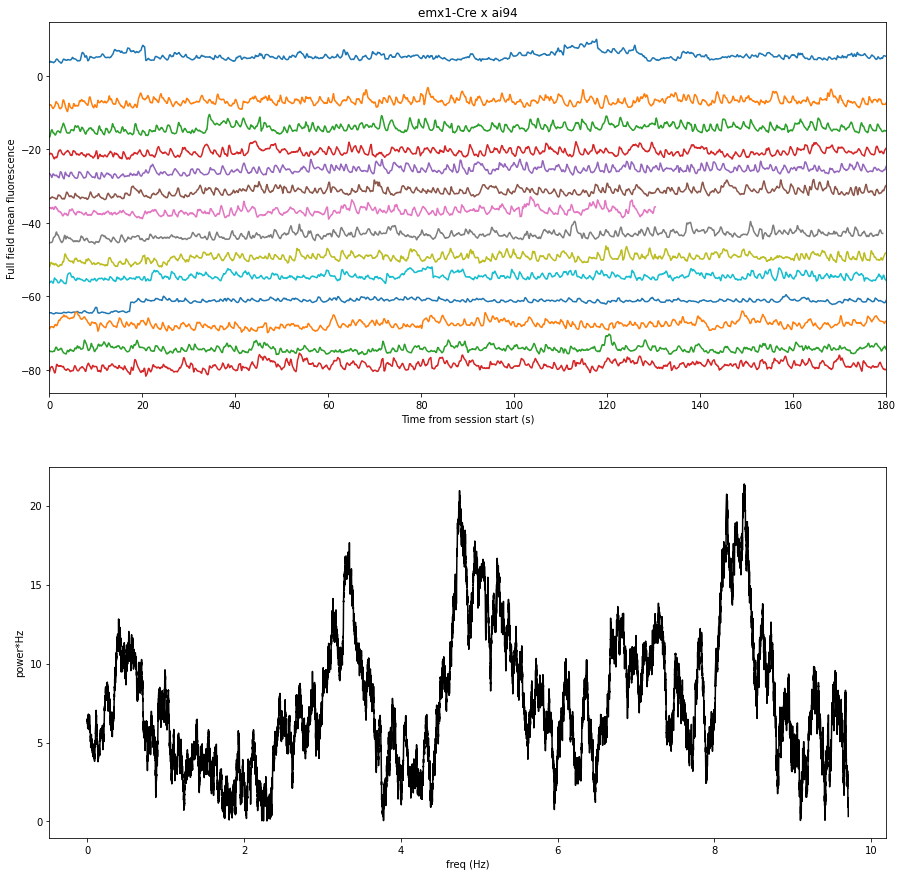

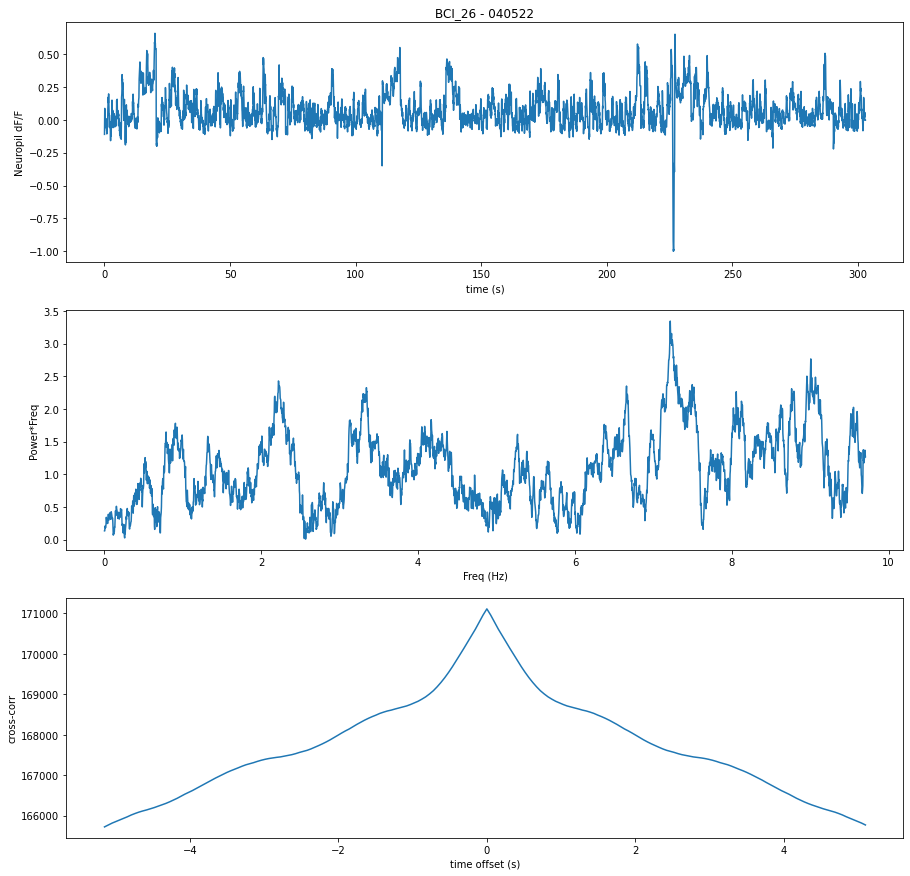

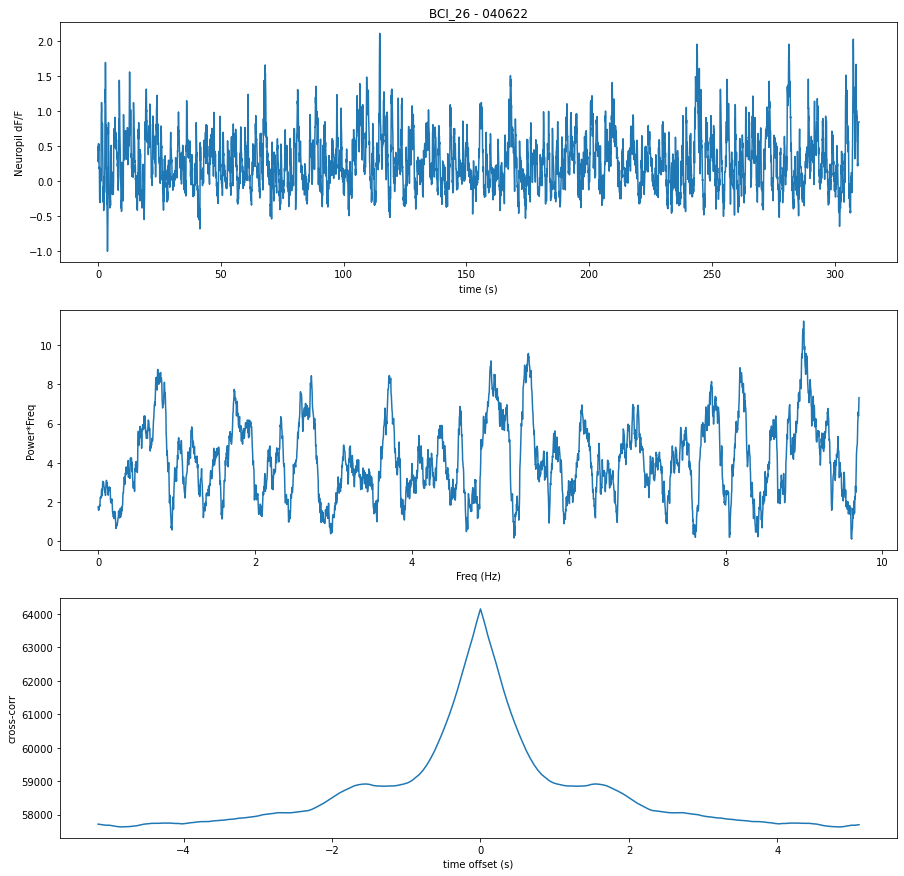

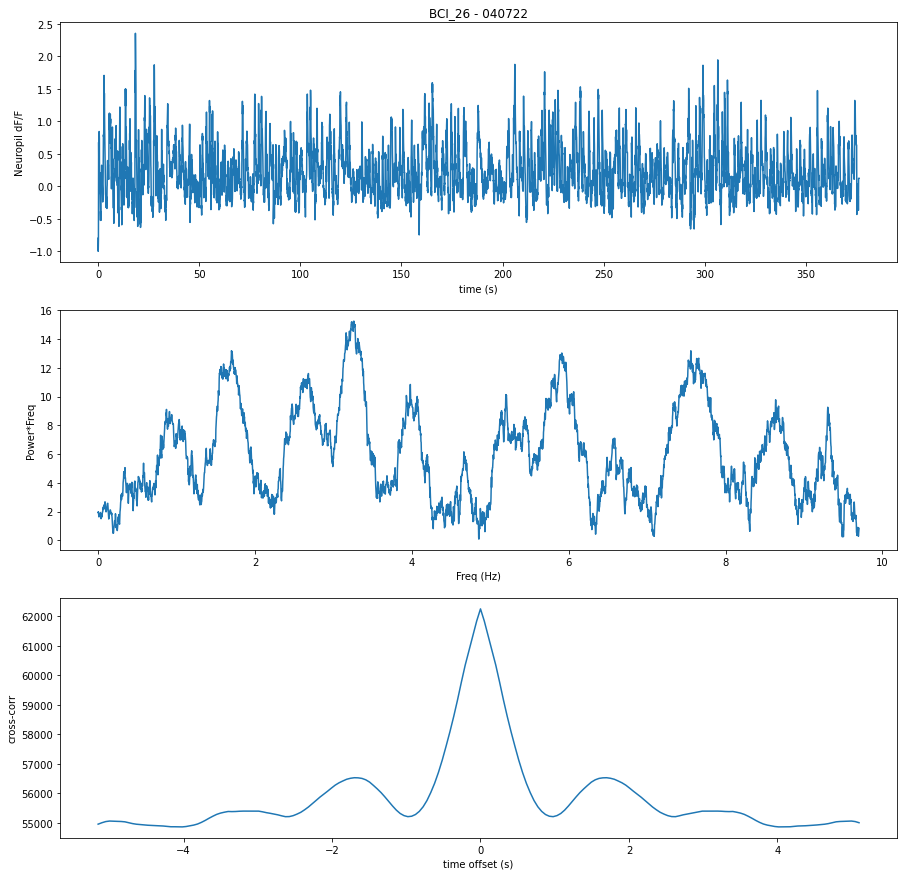

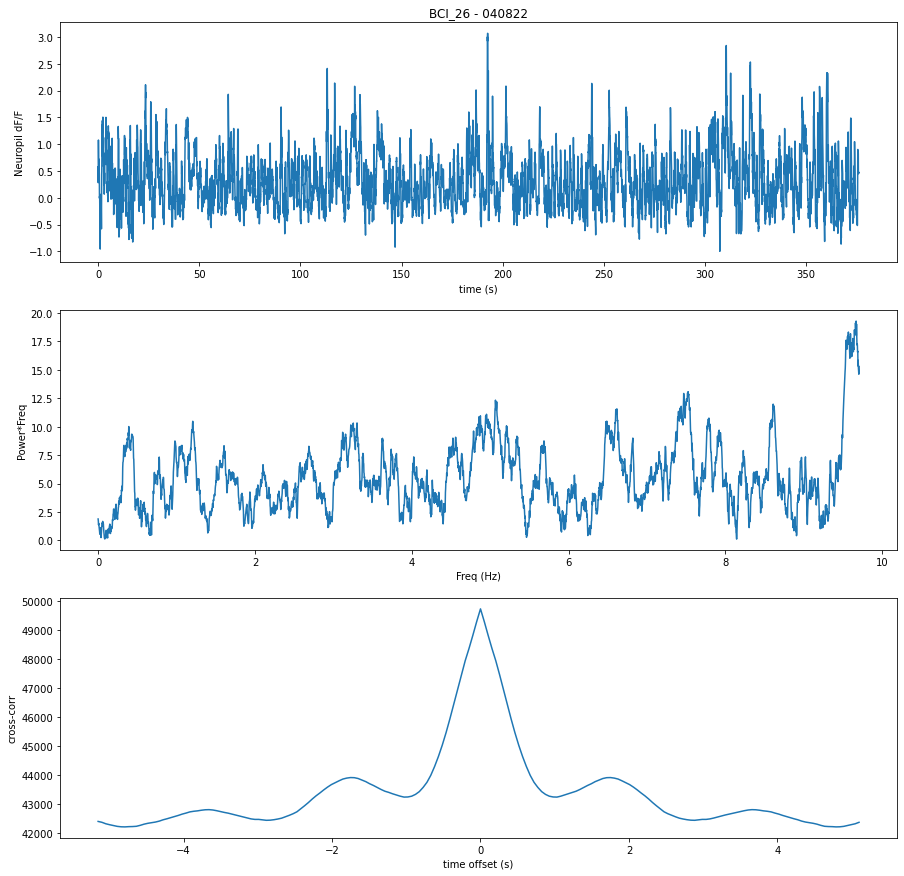

...

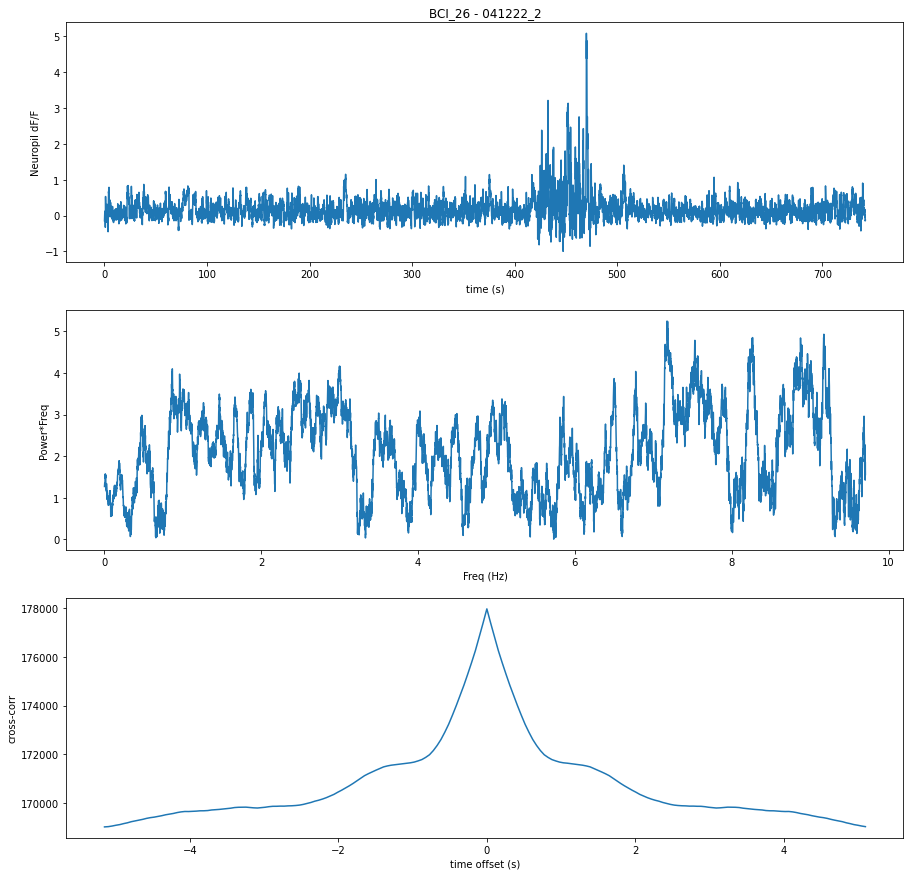

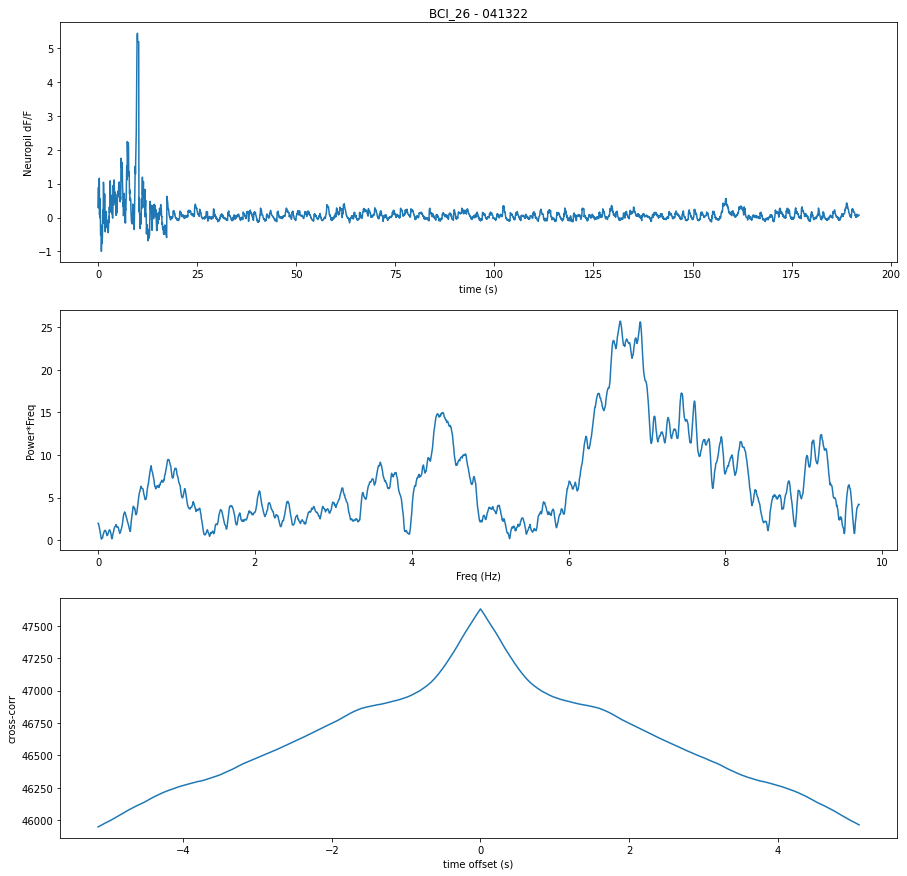

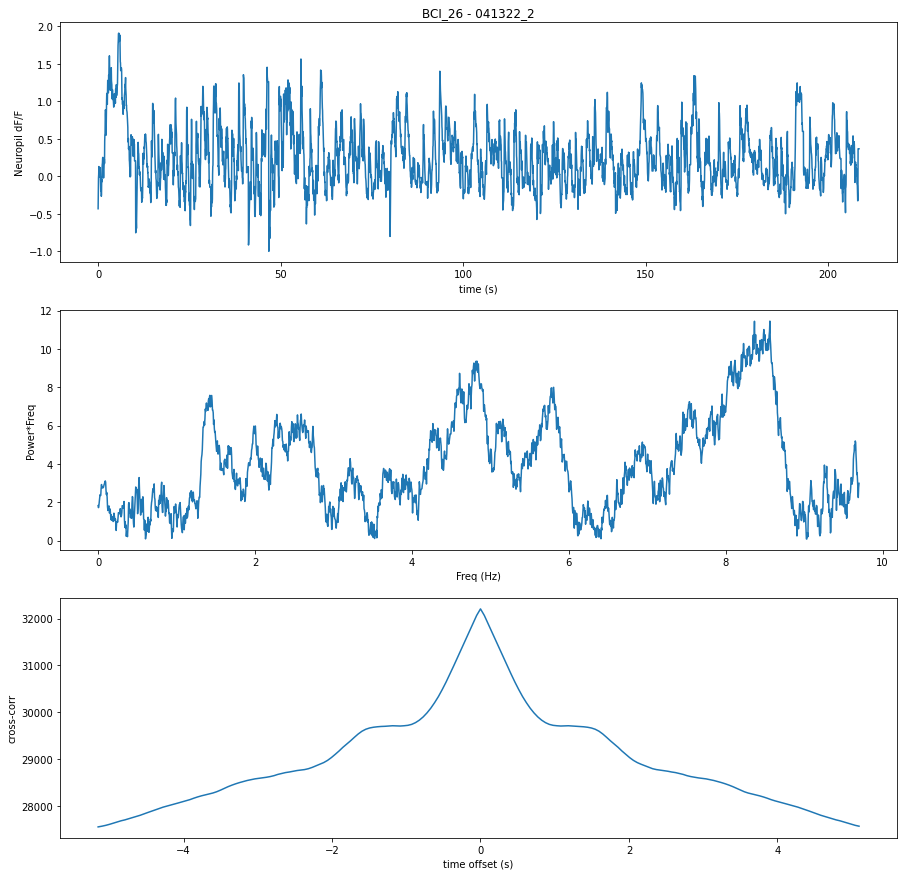

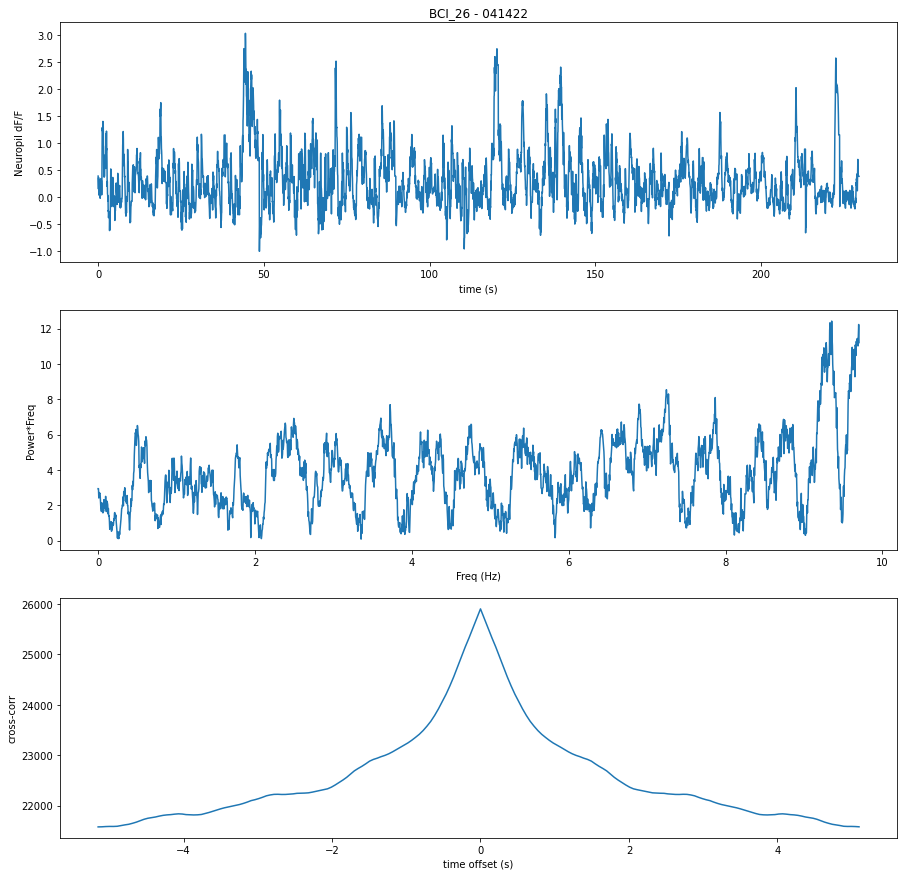

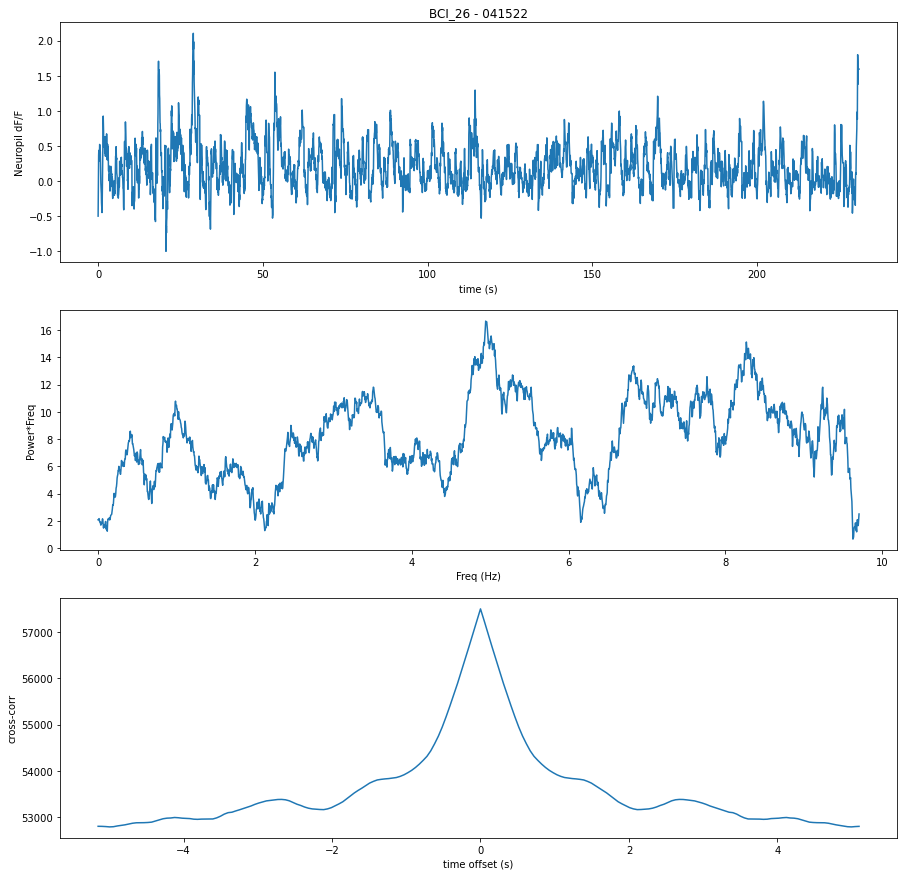

In [29]:
plot_stuff(data_dict,genotype)

In [1]:
# try to find epileptic activity

from scipy.ndimage import filters
import scipy
frames_to_skip_on_trial_starts =5
ax1end = 180
def plot_stuff(data_dict,title):
    offset = 0
    fig = plt.figure(figsize = [15,15])
    ax1 = fig.add_subplot(211)
    ax1.set_xlabel('Time from session start (s)')
    ax1.set_ylabel('Full field mean fluorescence')
    ax1.set_title(title)
    ax2 = fig.add_subplot(2,1,2)
    fneu_list = []
    for session in sessions:
        Fs = data_dict[session]['sampling_rate']
        trial_start_indices = np.asarray(data_dict[session]['all_si_frame_nums'])[:np.argmax(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][0])]
        start_idx = sum(trial_start_indices)

        #fneu_now = np.nanmean(data_dict[session]['Fneu'],0)#Fneu#dff_sessionwise #mean_FOV

        fneu_now = data_dict[session]['mean_FOV']
        if start_idx>0:
            fneu_now = fneu_now[:start_idx]

        fneu_now_ = []
        for s,e in zip(np.cumsum(trial_start_indices)[:-1],np.cumsum(trial_start_indices)[1:]):

            fneu_now_.append(fneu_now[s+frames_to_skip_on_trial_starts:e])
            fneu_now_.append([fneu_now_[-1][-1]]*frames_to_skip_on_trial_starts)
        fneu_now = np.concatenate(fneu_now_)
        fneu_now = scipy.stats.zscore(fneu_now)

        fneu_list.append(fneu_now)


        fft = scipy.fft.fft(fneu_now)
        fneu_now -=np.nanmin(fneu_now)
        fneu_filt = BCI_analysis.plot_utils.rollingfun(fneu_now,5)
        max_idx = np.argmax(np.arange(len(fneu_now))/Fs>ax1end)
        if max_idx>0:
            fneu_filt = fneu_filt[:max_idx]
        ax1.plot(np.arange(len(fneu_filt))/Fs,fneu_filt+offset)
        offset -= np.nanmax(fneu_filt)


        #freqHz = np.arange(0,len(fft))*Fs/len(fft);
        #fft = BCI_analysis.plot_utils.rollingfun(fft,5)
        #ax2.plot(freqHz[10:],np.abs(fft)[10:],alpha = .5)




        fs = data_dict[session]['sampling_rate']
        mean_fneu = fneu_now

        sig_baseline = 10 
        win_baseline = int(10*fs)
        Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
        Flow = filters.minimum_filter1d(Flow,    win_baseline)
        Flow = filters.maximum_filter1d(Flow,    win_baseline)

        dF = mean_fneu-Flow
        dFF = (mean_fneu-Flow)/Flow

        fig_fft = plt.figure(figsize = [15,15])
        ax_f0 = fig_fft.add_subplot(311)
        ax_f0.set_xlabel('time (s)')
        ax_f0.set_ylabel('Full field mean fluorescence (dF/F)')
        ax_f0.set_title('{} - {}'.format(subject,session))
        ax_fft = fig_fft.add_subplot(312)#,sharex = ax_f0)
        ax_fft.set_ylabel('Power*Freq')
        ax_fft.set_xlabel('Freq (Hz)')
        ax_so = fig_fft.add_subplot(313)
        #fftval = scipy.signal.stft(dFF, fs = fs)

        #fftval[0][fftval[0]<.5]=0

        ax_f0.plot(np.arange(len(mean_fneu))/fs,dFF)

        fft = scipy.fft.fft(dFF)

        e_ = int(len(fft)/2)
        freqHz = scipy.fft.fftfreq(len(dFF), d=1/Fs)
        fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
        ax_fft.plot(freqHz[:e_],np.abs(fft[:e_]))
        #ax_fft.imshow(np.abs(fftval[2]*fftval[0][:,np.newaxis]),aspect = 'auto', extent = [fftval[1][0],fftval[1][-1],fftval[0][0],fftval[0][-1]],origin = 'lower')
        #fft_matrix = np.abs(fftval[2]*fftval[0][:,np.newaxis])
        #so_vector = np.sum(fft_matrix[fftval[0]<6,:],0)/np.sum(fft_matrix,0)
        #ax_so.plot(fftval[1],BCI_analysis.plot_utils.rollingfun(so_vector,10))
        step = 100
        cc = scipy.signal.correlate(fneu_now,fneu_now)
        mid = int(len(cc)/2)
        ax_so.plot(np.arange(-step,step)/ data_dict[session]['sampling_rate'],cc[mid-step:mid+step])
        ax_so.set_xlabel('time offset (s)')
        ax_so.set_ylabel('cross-corr')



    fneu_now = np.concatenate(fneu_list)
    fft = scipy.fft.fft(fneu_now)
    #freqHz = np.arange(0,len(fft))*Fs/len(fft);
    freqHz = scipy.fft.fftfreq(len(fneu_now), d=1/Fs)
    
    fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
    e= np.argmax(np.diff(freqHz)<0)
    ax2.plot(freqHz[10:e],np.abs(fft)[10:e],alpha = 1,color = 'black')
    #ax2.set_xlim([0,10])

    #ax2.set_yscale('log')
    #ax2.set_ylim([0,500])
    ax2.set_ylabel('power*Hz')
    ax2.set_xlabel('freq (Hz)')
    ax1.set_xlim([0,180])
    #ax1.set_


# example FOV of BCI29, TETO 6s mouse bred at the Allen

NameError: name 'plt' is not defined

/tmp/ipykernel_26217/3876682389.py:52: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_26217/3876682389.py:53: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_26217/3876682389.py:54: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


NameError: name 'freq' is not defined

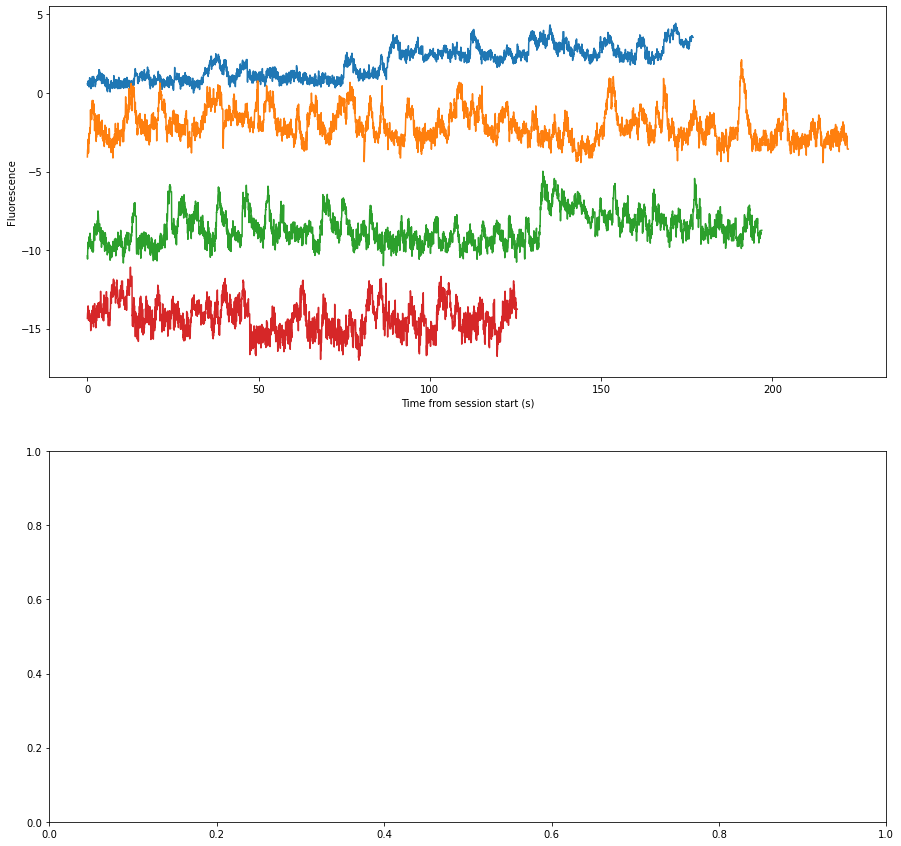

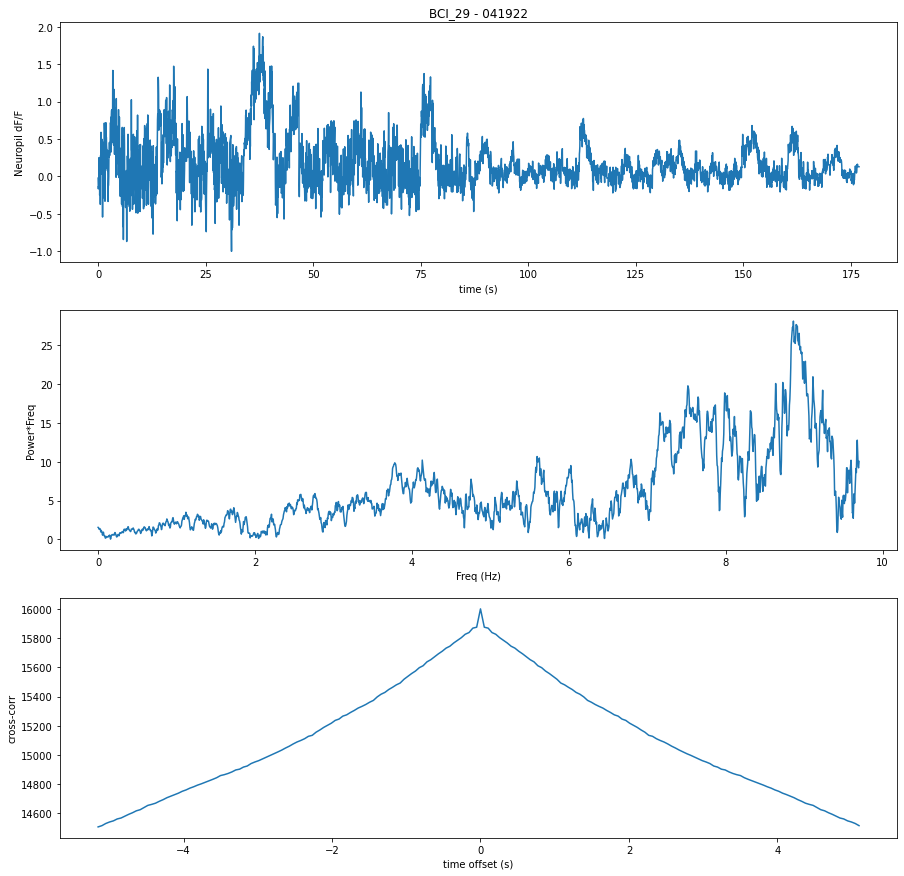

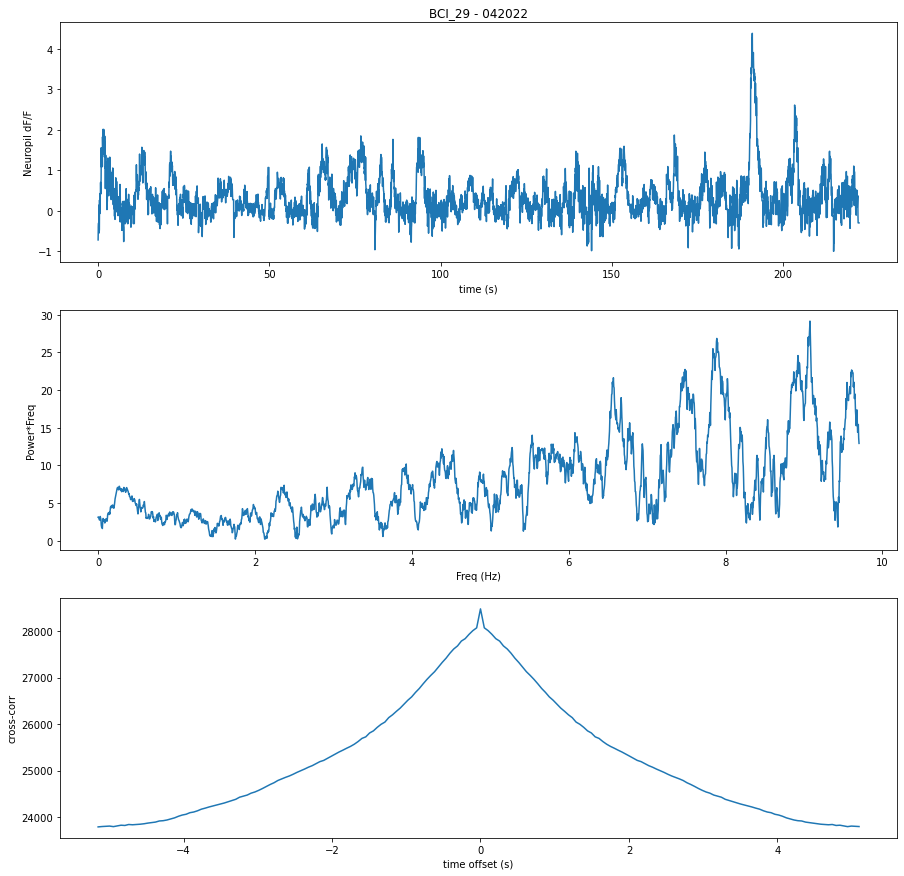

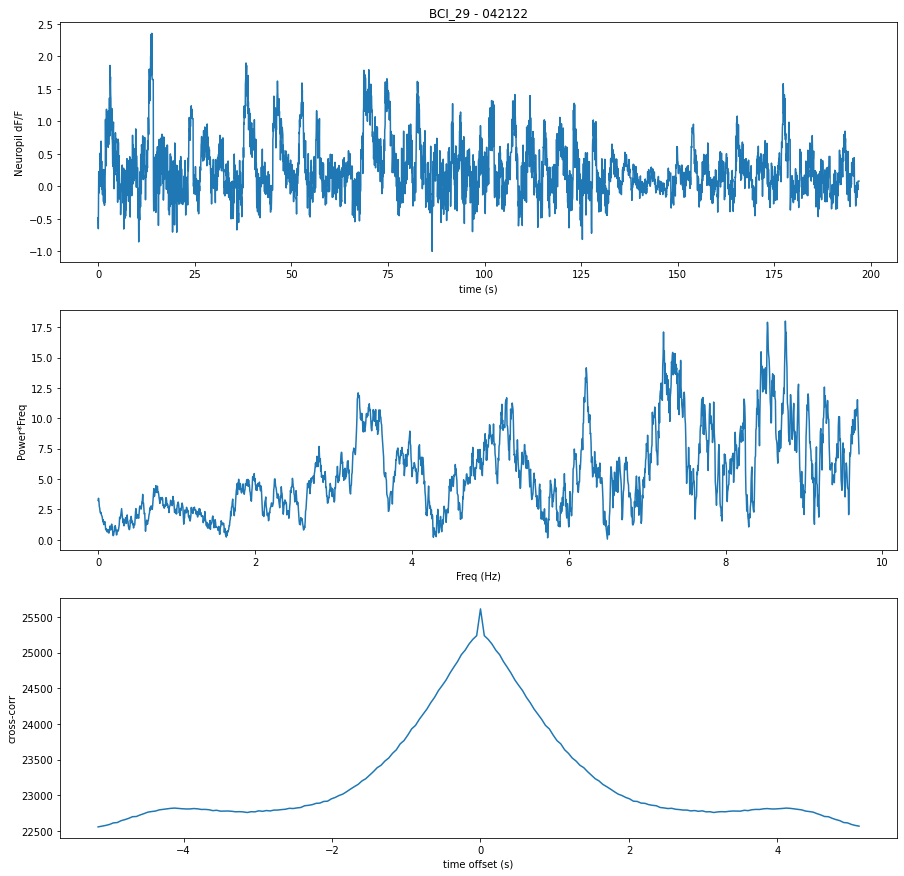

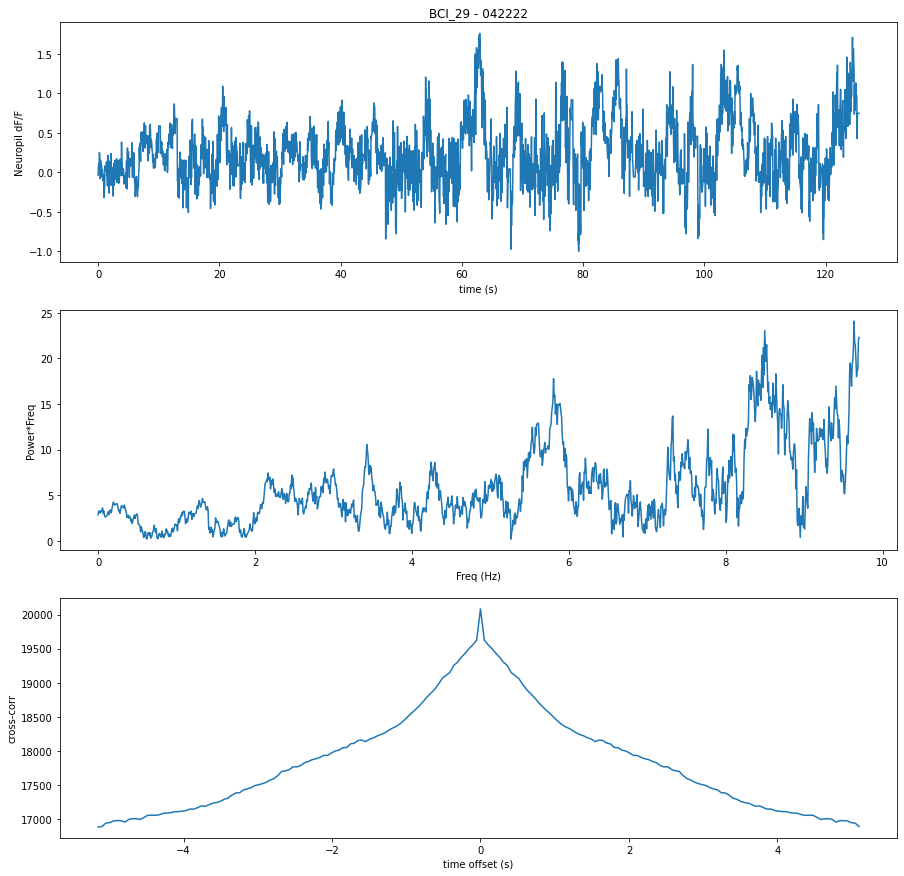

In [11]:
# try to find epileptic activity

from scipy.ndimage import filters
import scipy
frames_to_skip_on_trial_starts =5
offset = 0
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(211)
ax1.set_xlabel('Time from session start (s)')
ax1.set_ylabel('Fluorescence')
ax2 = fig.add_subplot(2,1,2)
fneu_list = []
for session in sessions:
    Fs = data_dict[session]['sampling_rate']
    trial_start_indices = np.asarray(data_dict[session]['all_si_frame_nums'])[:np.argmax(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][0])]
    start_idx = sum(trial_start_indices)
    
    fneu_now = np.nanmean(data_dict[session]['Fneu'],0)#Fneu#dff_sessionwise #mean_FOV
    
    #fneu_now = data_dict[session]['mean_FOV']
    #fneu_now = fneu_now[:start_idx]
    
    fneu_now_ = []
    for s,e in zip(np.cumsum(trial_start_indices)[:-1],np.cumsum(trial_start_indices)[1:]):
        
        fneu_now_.append(fneu_now[s+frames_to_skip_on_trial_starts:e])
        fneu_now_.append([fneu_now_[-1][-1]]*frames_to_skip_on_trial_starts)
    fneu_now = np.concatenate(fneu_now_)
    fneu_now = scipy.stats.zscore(fneu_now)
    
    fneu_list.append(fneu_now)
    
    
    fft = scipy.fft.fft(fneu_now)
    fneu_now -=np.nanmin(fneu_now)
    ax1.plot(np.arange(len(fneu_now))/Fs,fneu_now+offset)
    offset -= np.nanmax(fneu_now)

    
    #freqHz = np.arange(0,len(fft))*Fs/len(fft);
    #fft = BCI_analysis.plot_utils.rollingfun(fft,5)
    #ax2.plot(freqHz[10:],np.abs(fft)[10:],alpha = .5)
    
    
    
  
    fs = data_dict[session]['sampling_rate']
    mean_fneu = fneu_now

    sig_baseline = 10 
    win_baseline = int(10*fs)
    Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
    Flow = filters.minimum_filter1d(Flow,    win_baseline)
    Flow = filters.maximum_filter1d(Flow,    win_baseline)

    dF = mean_fneu-Flow
    dFF = (mean_fneu-Flow)/Flow

    fig_fft = plt.figure(figsize = [15,15])
    ax_f0 = fig_fft.add_subplot(311)
    ax_f0.set_xlabel('time (s)')
    ax_f0.set_ylabel('Neuropil dF/F')
    ax_f0.set_title('{} - {}'.format(subject,session))
    ax_fft = fig_fft.add_subplot(312)#,sharex = ax_f0)
    ax_fft.set_ylabel('Power*Freq')
    ax_fft.set_xlabel('Freq (Hz)')
    ax_so = fig_fft.add_subplot(313)
    #fftval = scipy.signal.stft(dFF, fs = fs)

    #fftval[0][fftval[0]<.5]=0

    ax_f0.plot(np.arange(len(mean_fneu))/fs,dFF)
    
    fft = scipy.fft.fft(dFF)
    
    e_ = int(len(fft)/2)
    freqHz = scipy.fft.fftfreq(len(dFF), d=1/Fs)
    fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
    ax_fft.plot(freqHz[:e_],np.abs(fft[:e_]))
    #ax_fft.imshow(np.abs(fftval[2]*fftval[0][:,np.newaxis]),aspect = 'auto', extent = [fftval[1][0],fftval[1][-1],fftval[0][0],fftval[0][-1]],origin = 'lower')
    #fft_matrix = np.abs(fftval[2]*fftval[0][:,np.newaxis])
    #so_vector = np.sum(fft_matrix[fftval[0]<6,:],0)/np.sum(fft_matrix,0)
    #ax_so.plot(fftval[1],BCI_analysis.plot_utils.rollingfun(so_vector,10))
    step = 100
    cc = scipy.signal.correlate(fneu_now,fneu_now)
    mid = int(len(cc)/2)
    ax_so.plot(np.arange(-step,step)/ data_dict[session]['sampling_rate'],cc[mid-step:mid+step])
    ax_so.set_xlabel('time offset (s)')
    ax_so.set_ylabel('cross-corr')

    

fneu_now = np.concatenate(fneu_list)
fft = scipy.fft.fft(fneu_now)
#freqHz = np.arange(0,len(fft))*Fs/len(fft);
freqHz = scipy.fft.fftfreq(len(fneu_now), d=1/Fs)
plt.plot(freq)
fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
e= np.argmax(np.diff(freqHz)<0)
ax2.plot(freqHz[10:e],np.abs(fft)[10:e],alpha = 1,color = 'black')
#ax2.set_xlim([0,10])

#ax2.set_yscale('log')
#ax2.set_ylim([0,500])
ax2.set_ylabel('power*Hz')
ax2.set_xlabel('freq (Hz)')
#ax1.set_


# example FOV of BCI26, EMX1-cre mouse bred at the Allen

/tmp/ipykernel_26217/3876682389.py:52: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_26217/3876682389.py:53: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_26217/3876682389.py:54: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


NameError: name 'freq' is not defined

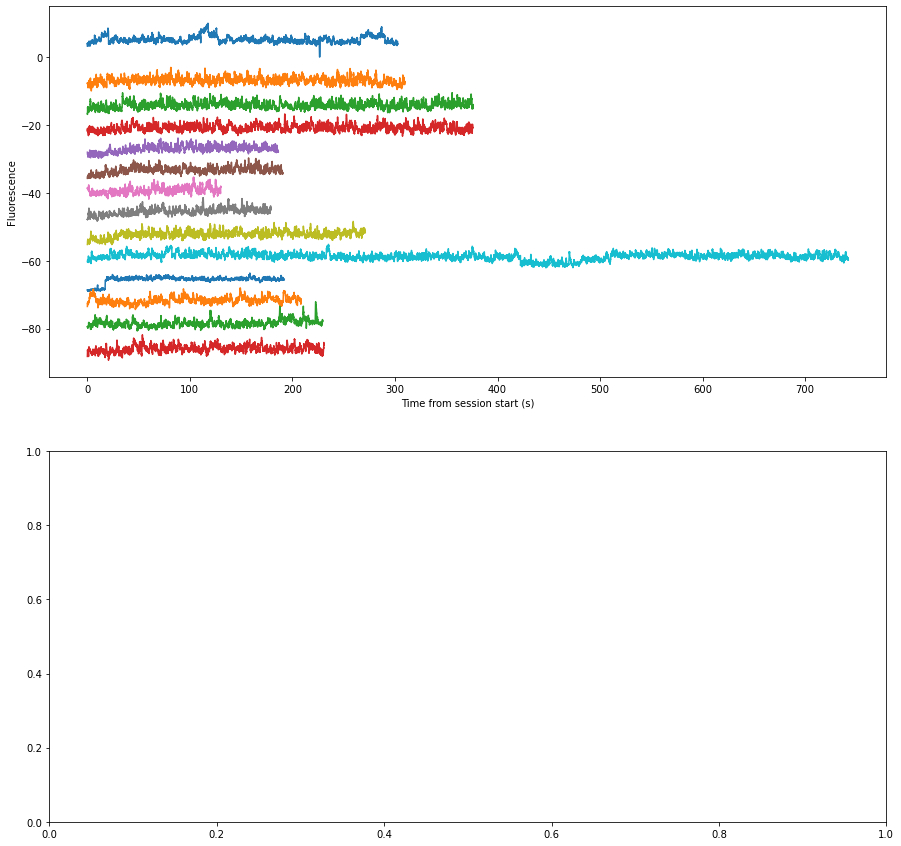

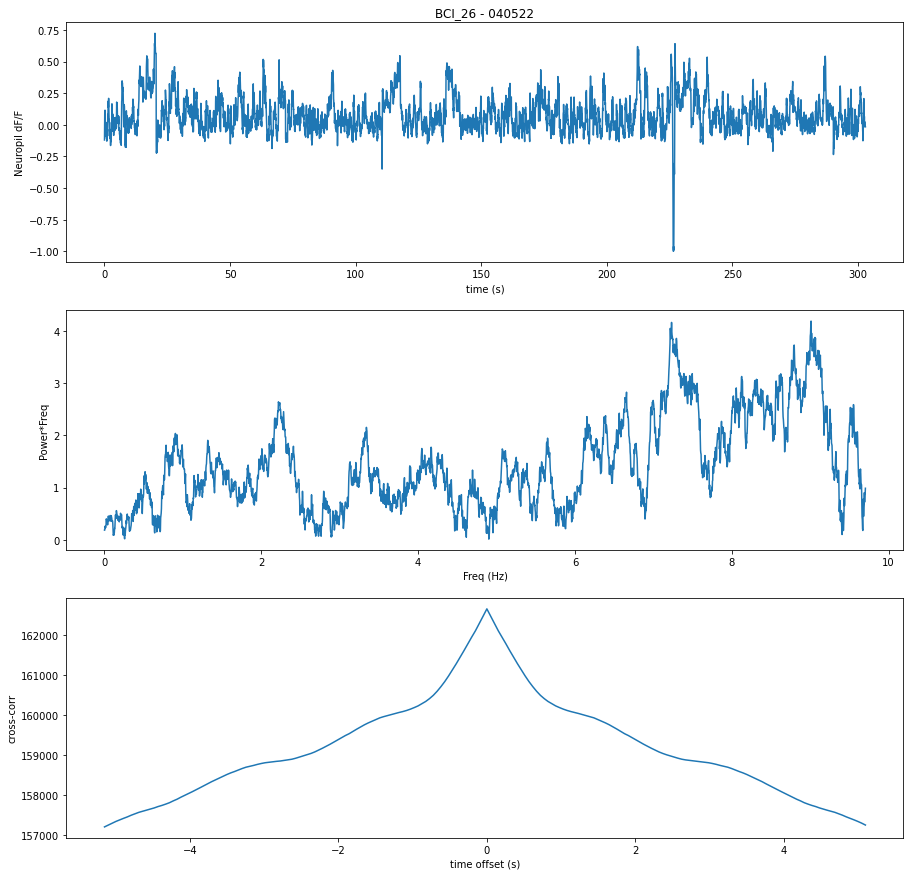

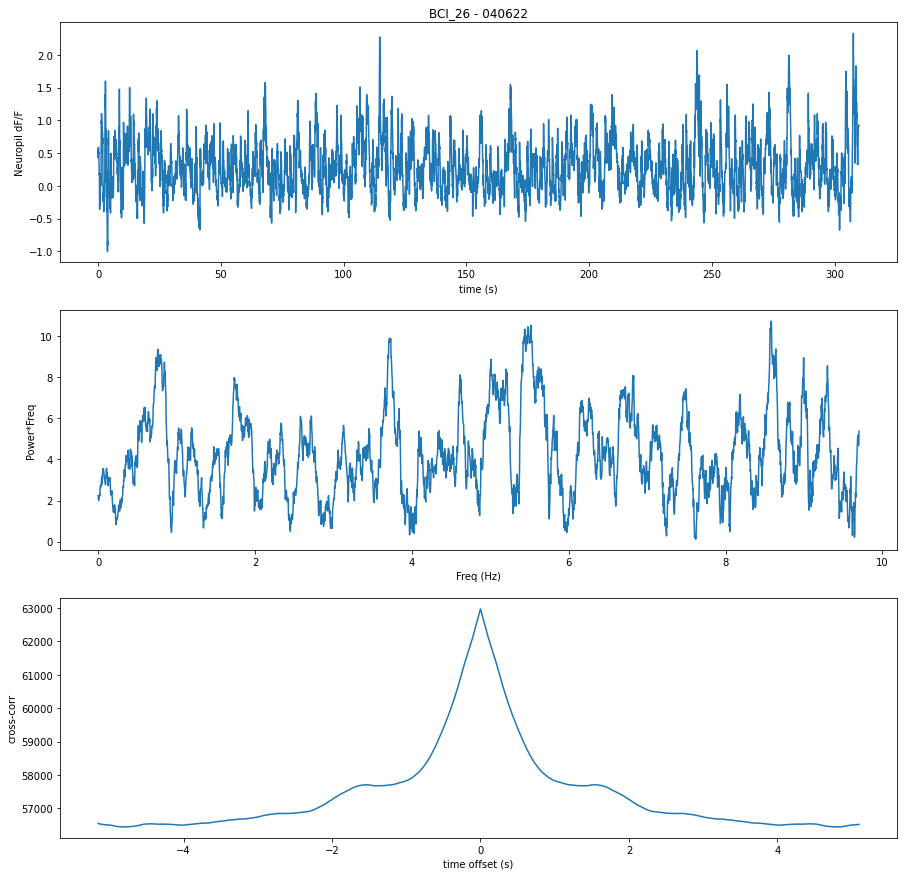

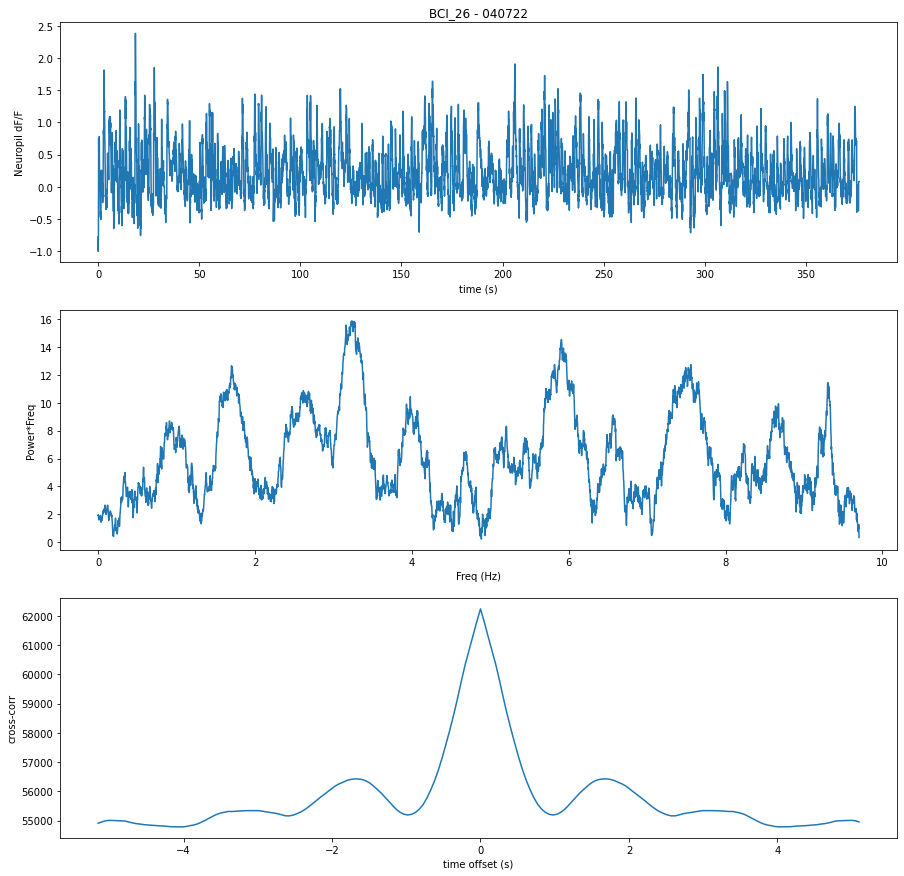

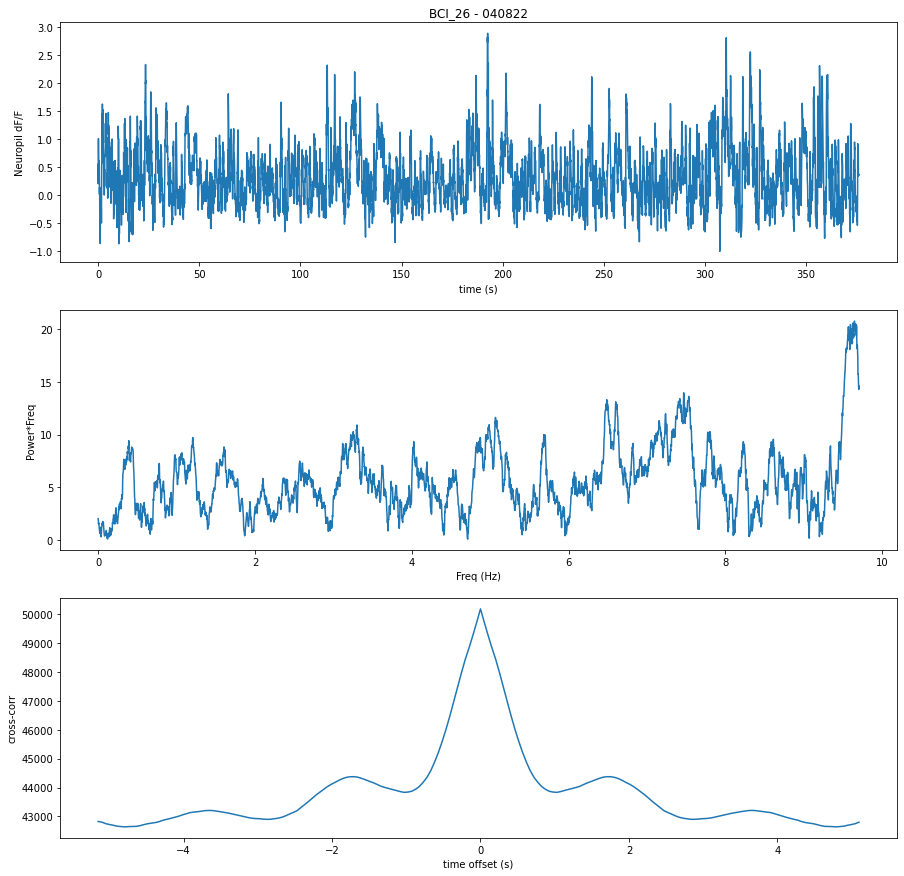

...

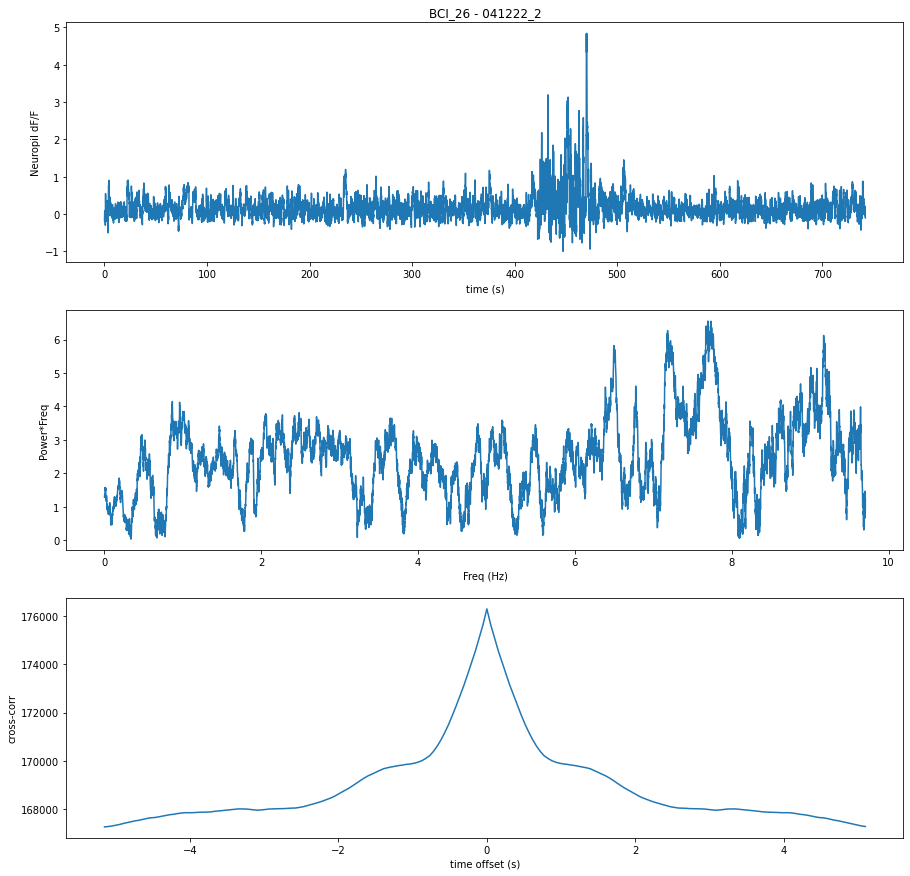

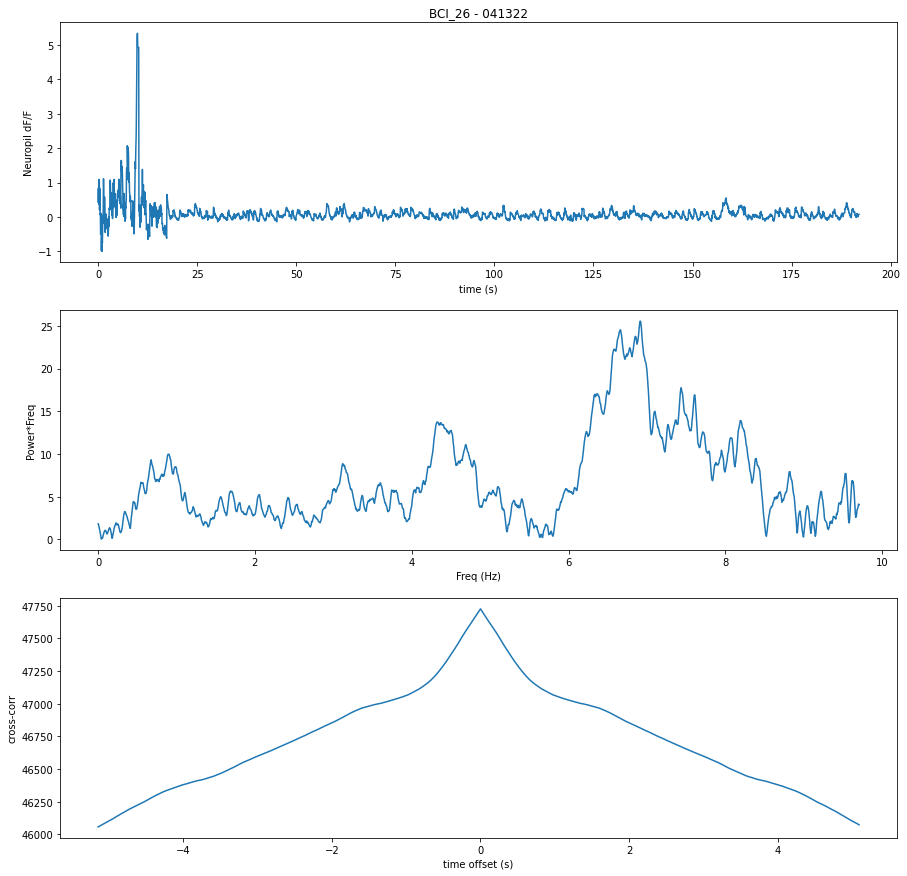

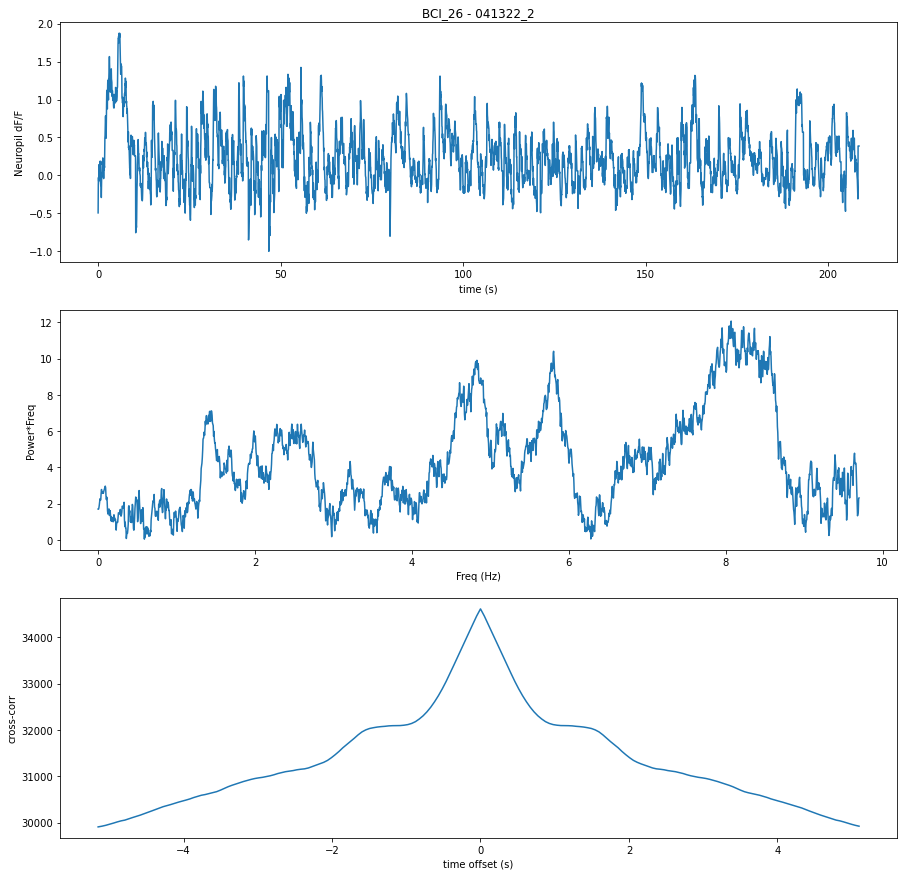

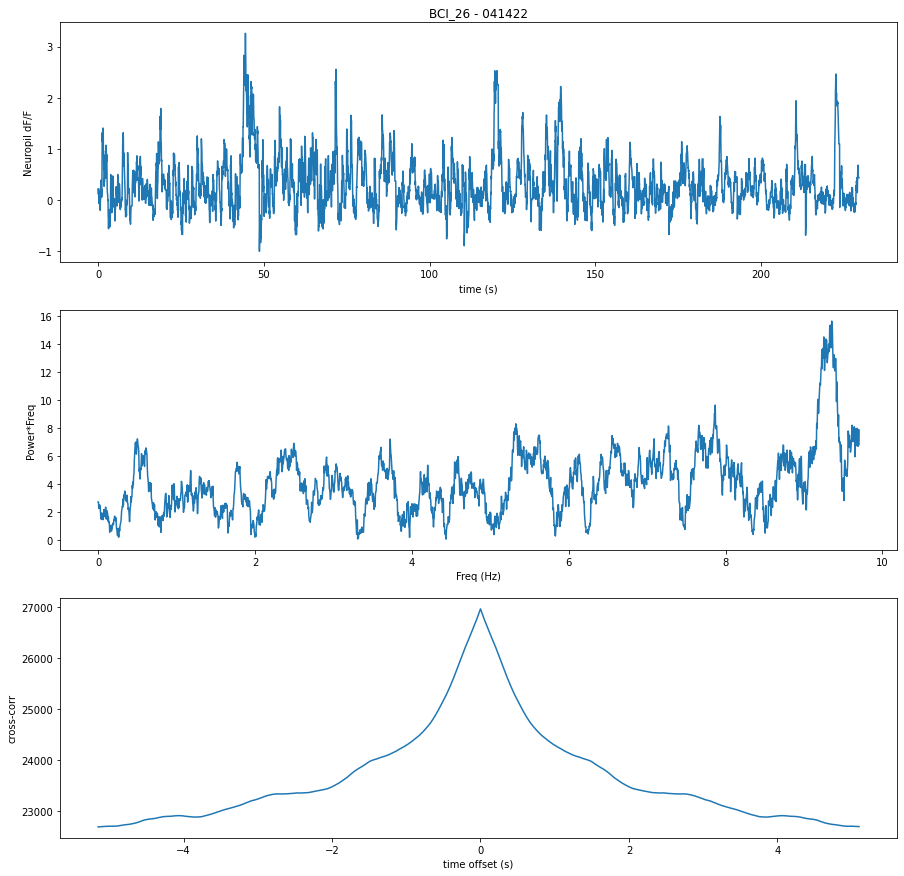

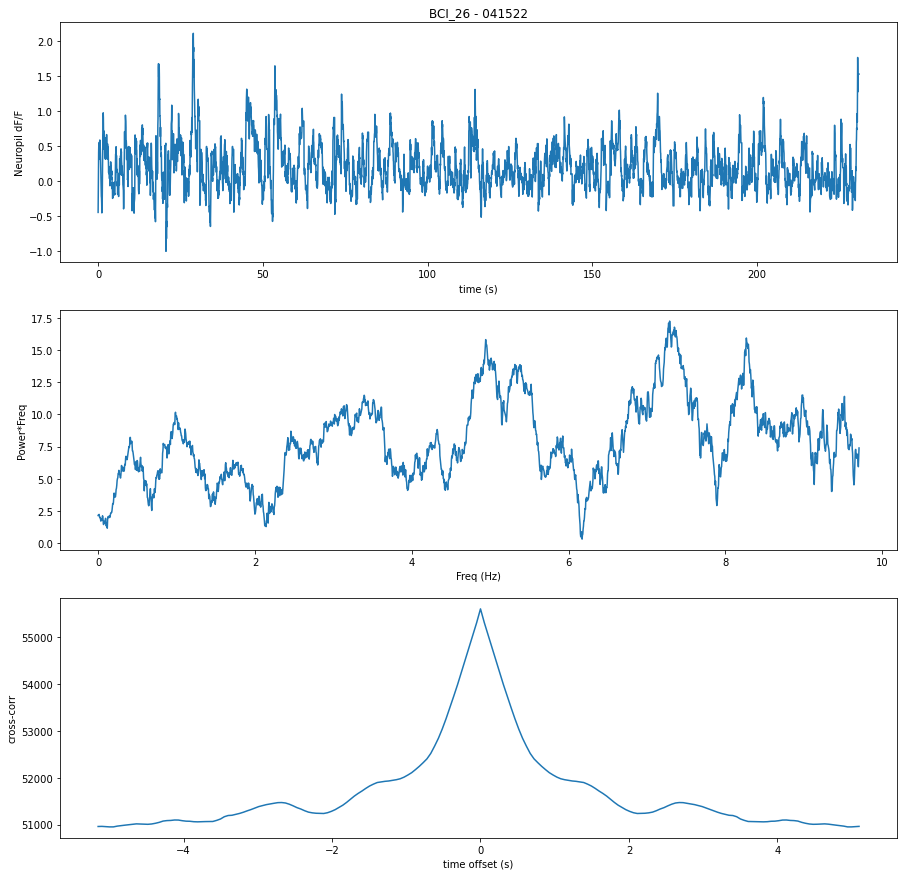

# BCI60 slc17a7 IRES Cre X AI229 (that is similar to AI228, that was anecdotally reported to have epilepsy)

/tmp/ipykernel_26217/3876682389.py:52: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_26217/3876682389.py:53: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_26217/3876682389.py:54: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


NameError: name 'freq' is not defined

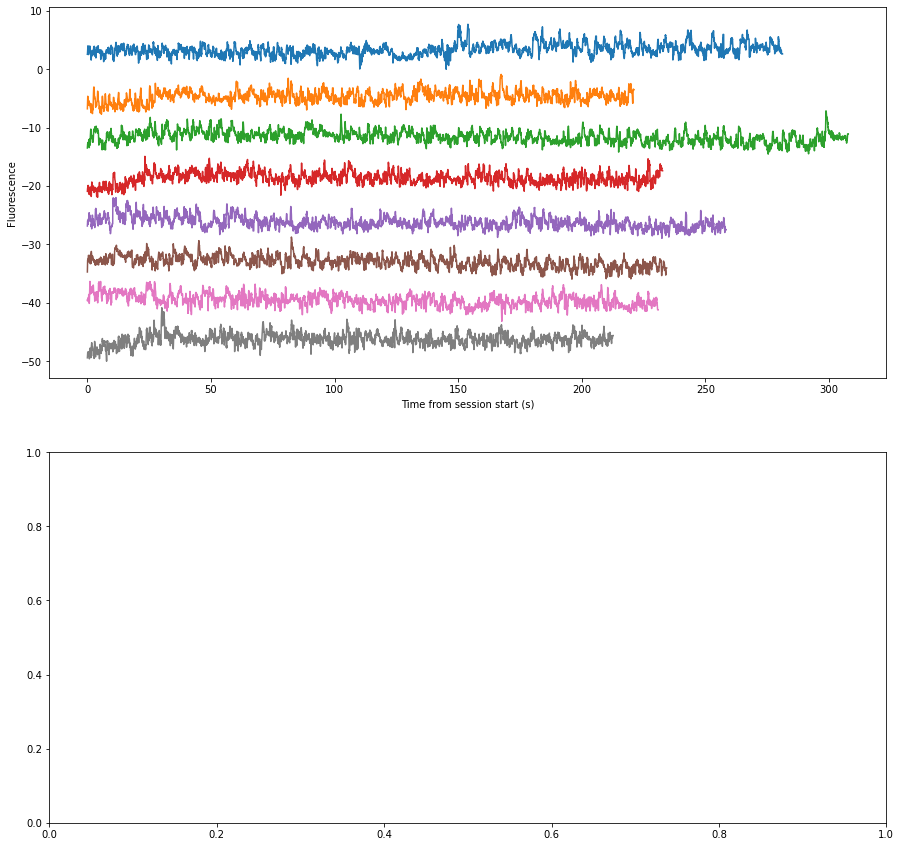

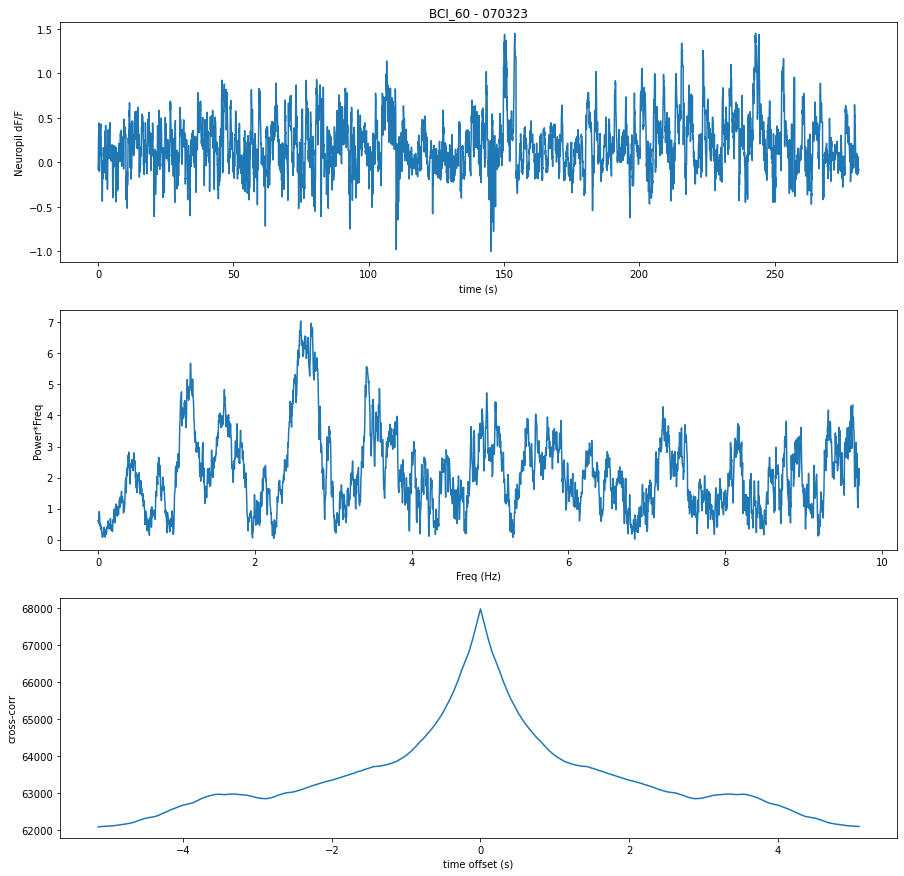

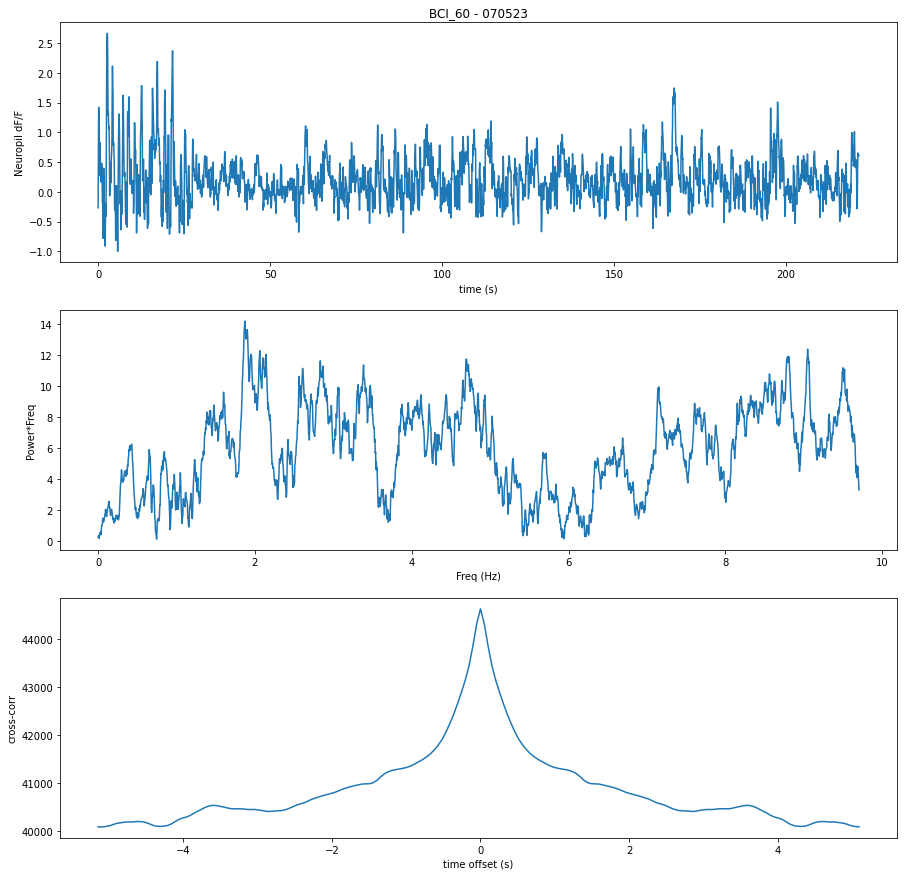

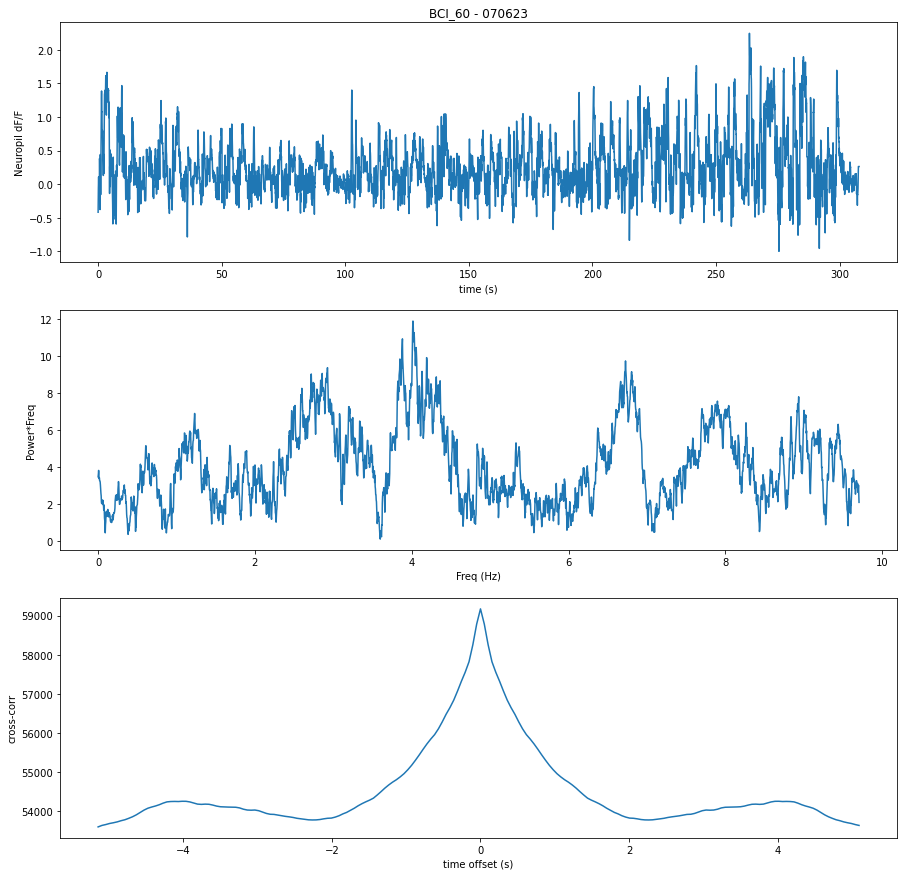

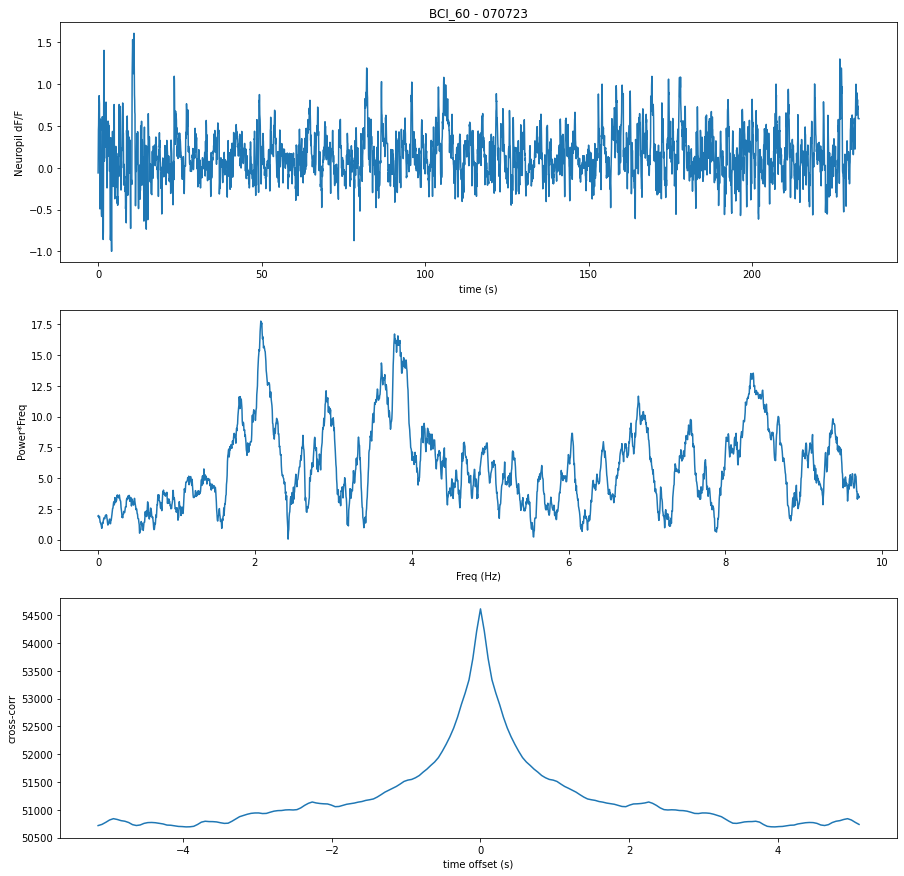

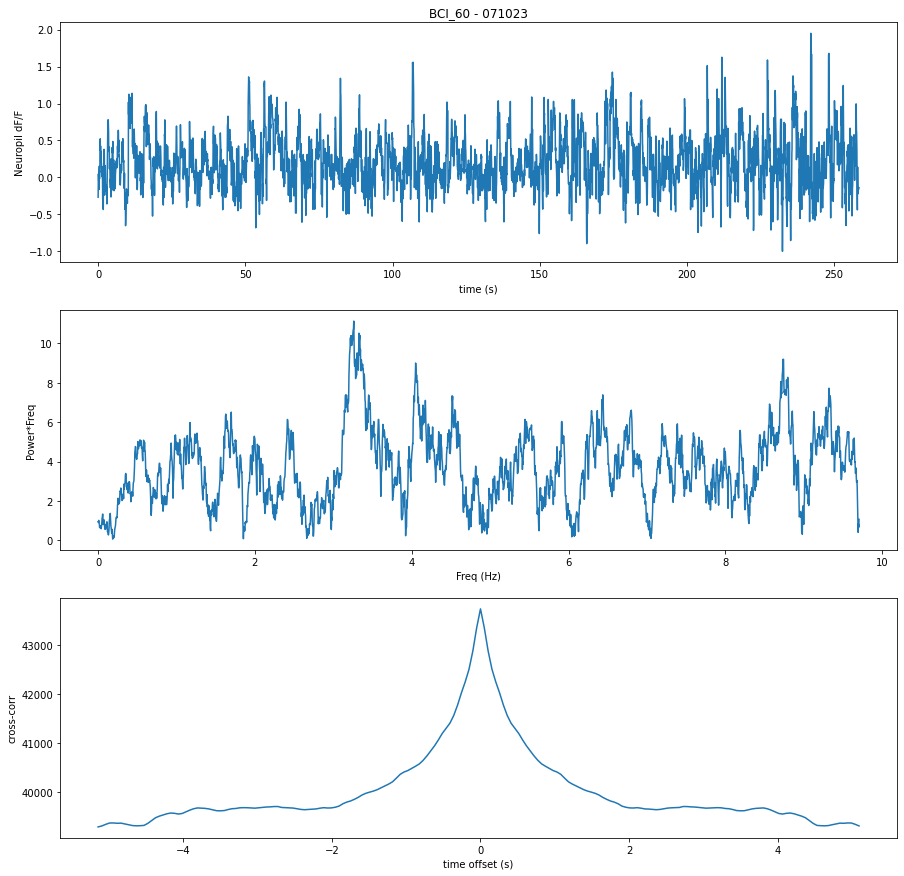

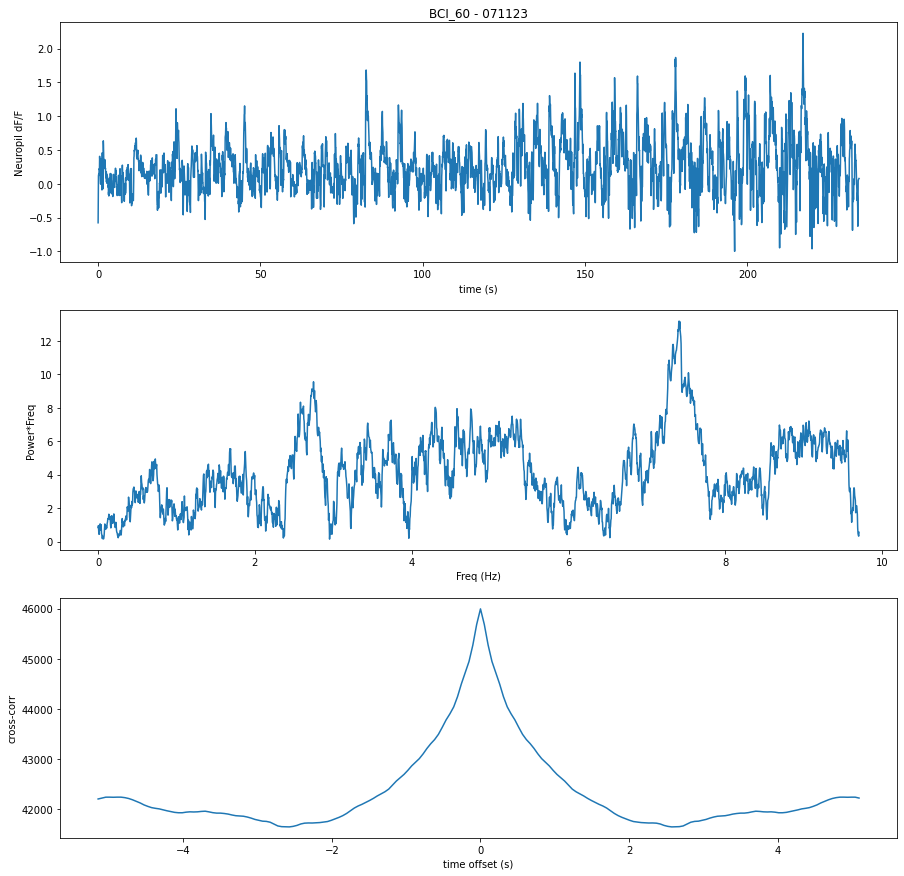

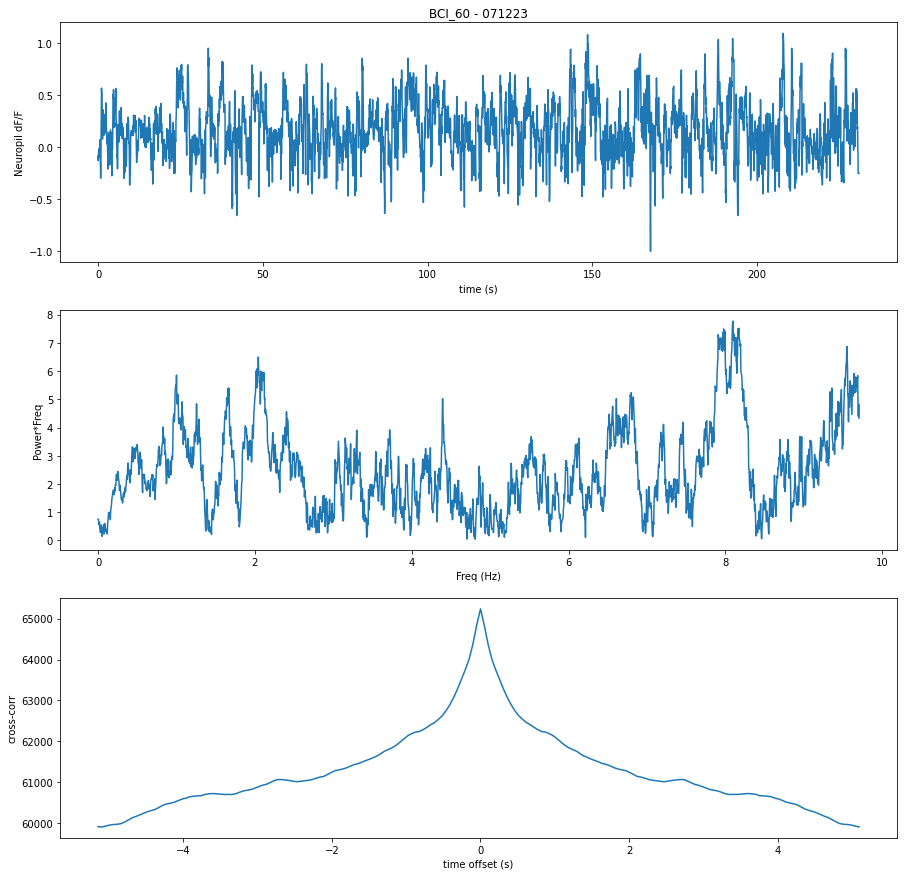

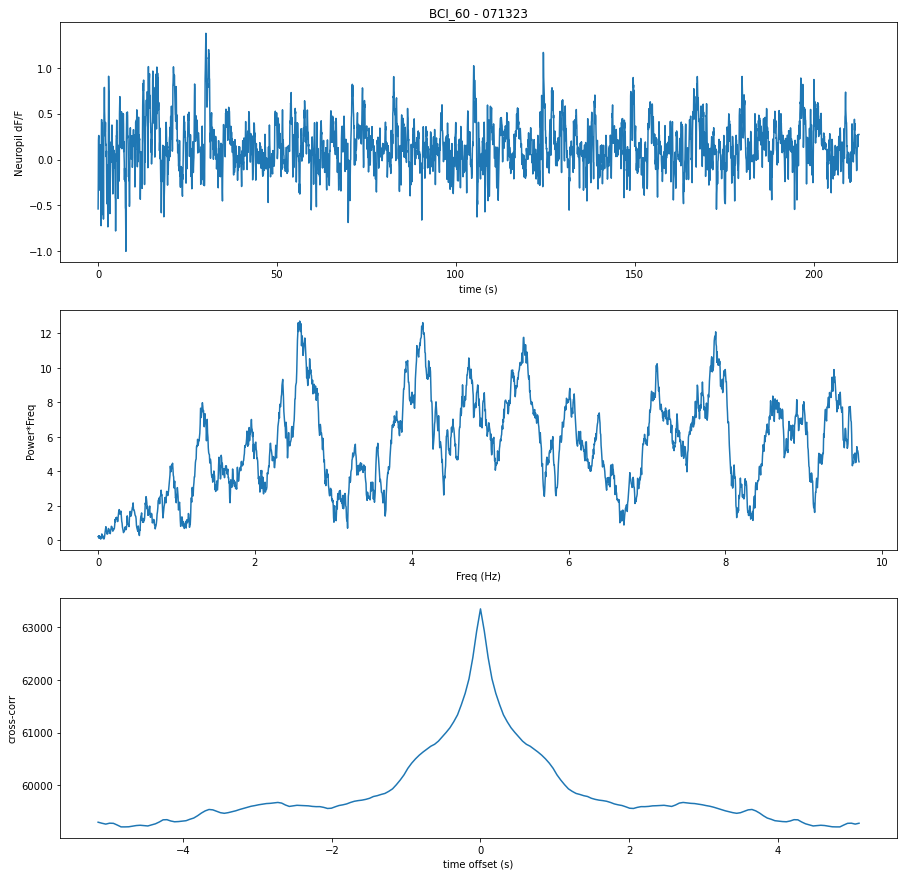

In [7]:
# try to find epileptic activity

from scipy.ndimage import filters
import scipy
frames_to_skip_on_trial_starts =5
offset = 0
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(211)
ax1.set_xlabel('Time from session start (s)')
ax1.set_ylabel('Fluorescence')
ax2 = fig.add_subplot(2,1,2)
fneu_list = []
for session in sessions:
    Fs = data_dict[session]['sampling_rate']
    trial_start_indices = np.asarray(data_dict[session]['all_si_frame_nums'])[:np.argmax(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][0])]
    start_idx = sum(trial_start_indices)
    
    fneu_now = np.nanmean(data_dict[session]['Fneu'],0)#Fneu#dff_sessionwise #mean_FOV
    
    #fneu_now = data_dict[session]['mean_FOV']
    #fneu_now = fneu_now[:start_idx]
    
    fneu_now_ = []
    for s,e in zip(np.cumsum(trial_start_indices)[:-1],np.cumsum(trial_start_indices)[1:]):
        
        fneu_now_.append(fneu_now[s+frames_to_skip_on_trial_starts:e])
        fneu_now_.append([fneu_now_[-1][-1]]*frames_to_skip_on_trial_starts)
    fneu_now = np.concatenate(fneu_now_)
    fneu_now = scipy.stats.zscore(fneu_now)
    
    fneu_list.append(fneu_now)
    
    
    fft = scipy.fft.fft(fneu_now)
    fneu_now -=np.nanmin(fneu_now)
    ax1.plot(np.arange(len(fneu_now))/Fs,fneu_now+offset)
    offset -= np.nanmax(fneu_now)

    
    #freqHz = np.arange(0,len(fft))*Fs/len(fft);
    #fft = BCI_analysis.plot_utils.rollingfun(fft,5)
    #ax2.plot(freqHz[10:],np.abs(fft)[10:],alpha = .5)
    
    
    
  
    fs = data_dict[session]['sampling_rate']
    mean_fneu = fneu_now

    sig_baseline = 10 
    win_baseline = int(10*fs)
    Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
    Flow = filters.minimum_filter1d(Flow,    win_baseline)
    Flow = filters.maximum_filter1d(Flow,    win_baseline)

    dF = mean_fneu-Flow
    dFF = (mean_fneu-Flow)/Flow

    fig_fft = plt.figure(figsize = [15,15])
    ax_f0 = fig_fft.add_subplot(311)
    ax_f0.set_xlabel('time (s)')
    ax_f0.set_ylabel('Neuropil dF/F')
    ax_f0.set_title('{} - {}'.format(subject,session))
    ax_fft = fig_fft.add_subplot(312)#,sharex = ax_f0)
    ax_fft.set_ylabel('Power*Freq')
    ax_fft.set_xlabel('Freq (Hz)')
    ax_so = fig_fft.add_subplot(313)
    #fftval = scipy.signal.stft(dFF, fs = fs)

    #fftval[0][fftval[0]<.5]=0

    ax_f0.plot(np.arange(len(mean_fneu))/fs,dFF)
    
    fft = scipy.fft.fft(dFF)
    
    e_ = int(len(fft)/2)
    freqHz = scipy.fft.fftfreq(len(dFF), d=1/Fs)
    fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
    ax_fft.plot(freqHz[:e_],np.abs(fft[:e_]))
    #ax_fft.imshow(np.abs(fftval[2]*fftval[0][:,np.newaxis]),aspect = 'auto', extent = [fftval[1][0],fftval[1][-1],fftval[0][0],fftval[0][-1]],origin = 'lower')
    #fft_matrix = np.abs(fftval[2]*fftval[0][:,np.newaxis])
    #so_vector = np.sum(fft_matrix[fftval[0]<6,:],0)/np.sum(fft_matrix,0)
    #ax_so.plot(fftval[1],BCI_analysis.plot_utils.rollingfun(so_vector,10))
    step = 100
    cc = scipy.signal.correlate(fneu_now,fneu_now)
    mid = int(len(cc)/2)
    ax_so.plot(np.arange(-step,step)/ data_dict[session]['sampling_rate'],cc[mid-step:mid+step])
    ax_so.set_xlabel('time offset (s)')
    ax_so.set_ylabel('cross-corr')

    

fneu_now = np.concatenate(fneu_list)
fft = scipy.fft.fft(fneu_now)
#freqHz = np.arange(0,len(fft))*Fs/len(fft);
freqHz = scipy.fft.fftfreq(len(fneu_now), d=1/Fs)
plt.plot(freq)
fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
e= np.argmax(np.diff(freqHz)<0)
ax2.plot(freqHz[10:e],np.abs(fft)[10:e],alpha = 1,color = 'black')
#ax2.set_xlim([0,10])

#ax2.set_yscale('log')
#ax2.set_ylim([0,500])
ax2.set_ylabel('power*Hz')
ax2.set_xlabel('freq (Hz)')
#ax1.set_


# BCI64 slc17a7 IRES Cre X AI228

/tmp/ipykernel_32267/1472076914.py:52: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
/tmp/ipykernel_32267/1472076914.py:53: DeprecationWarning: Please use `minimum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.minimum_filter1d(Flow,    win_baseline)
/tmp/ipykernel_32267/1472076914.py:54: DeprecationWarning: Please use `maximum_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Flow = filters.maximum_filter1d(Flow,    win_baseline)


Text(0.5, 0, 'freq (Hz)')

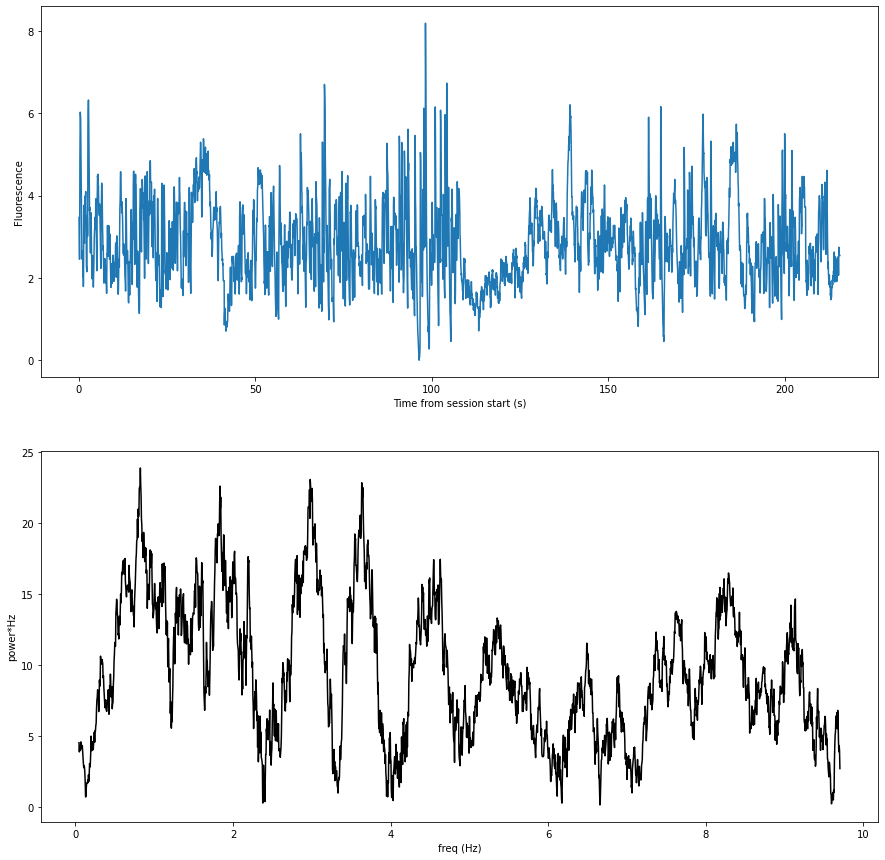

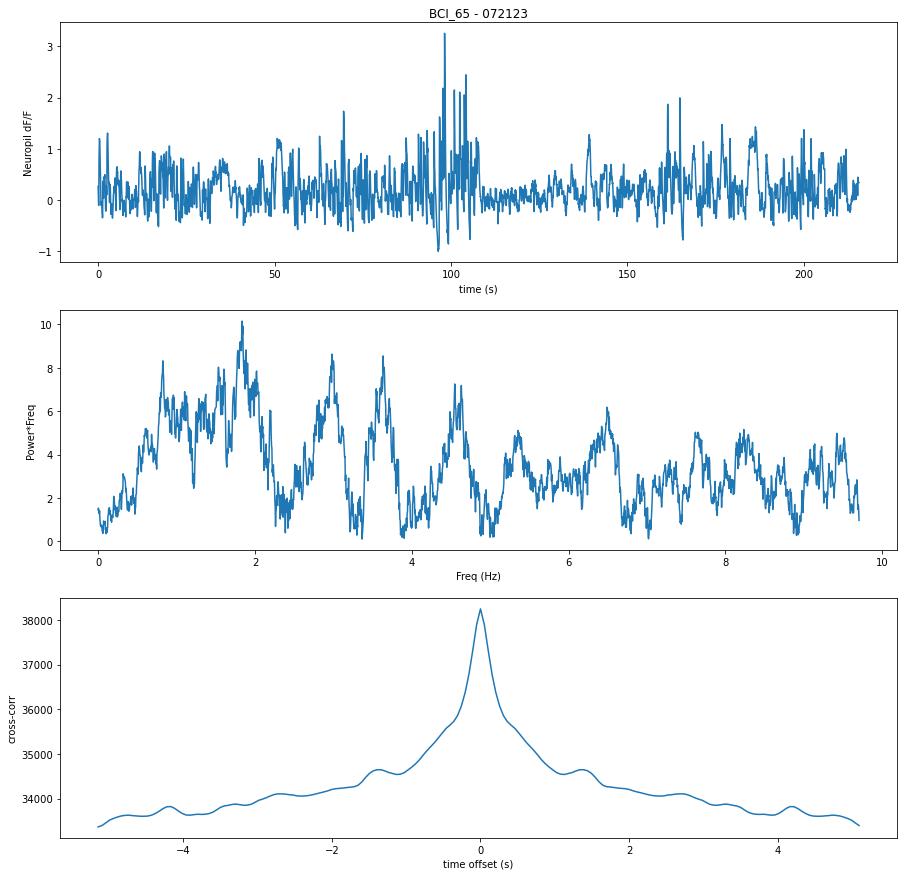

In [9]:
# try to find epileptic activity

from scipy.ndimage import filters
import scipy
frames_to_skip_on_trial_starts =5
offset = 0
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(211)
ax1.set_xlabel('Time from session start (s)')
ax1.set_ylabel('Fluorescence')
ax2 = fig.add_subplot(2,1,2)
fneu_list = []
for session in sessions:
    Fs = data_dict[session]['sampling_rate']
    trial_start_indices = np.asarray(data_dict[session]['all_si_frame_nums'])[:np.argmax(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][0])]
    start_idx = sum(trial_start_indices)
    
    fneu_now = np.nanmean(data_dict[session]['Fneu'],0)#Fneu#dff_sessionwise #mean_FOV
    
    #fneu_now = data_dict[session]['mean_FOV']
    #fneu_now = fneu_now[:start_idx]
    
    fneu_now_ = []
    for s,e in zip(np.cumsum(trial_start_indices)[:-1],np.cumsum(trial_start_indices)[1:]):
        
        fneu_now_.append(fneu_now[s+frames_to_skip_on_trial_starts:e])
        fneu_now_.append([fneu_now_[-1][-1]]*frames_to_skip_on_trial_starts)
    fneu_now = np.concatenate(fneu_now_)
    fneu_now = scipy.stats.zscore(fneu_now)
    
    fneu_list.append(fneu_now)
    
    
    fft = scipy.fft.fft(fneu_now)
    fneu_now -=np.nanmin(fneu_now)
    ax1.plot(np.arange(len(fneu_now))/Fs,fneu_now+offset)
    offset -= np.nanmax(fneu_now)

    
    #freqHz = np.arange(0,len(fft))*Fs/len(fft);
    #fft = BCI_analysis.plot_utils.rollingfun(fft,5)
    #ax2.plot(freqHz[10:],np.abs(fft)[10:],alpha = .5)
    
    
    
  
    fs = data_dict[session]['sampling_rate']
    mean_fneu = fneu_now

    sig_baseline = 10 
    win_baseline = int(10*fs)
    Flow = filters.gaussian_filter(mean_fneu,    sig_baseline)
    Flow = filters.minimum_filter1d(Flow,    win_baseline)
    Flow = filters.maximum_filter1d(Flow,    win_baseline)

    dF = mean_fneu-Flow
    dFF = (mean_fneu-Flow)/Flow

    fig_fft = plt.figure(figsize = [15,15])
    ax_f0 = fig_fft.add_subplot(311)
    ax_f0.set_xlabel('time (s)')
    ax_f0.set_ylabel('Neuropil dF/F')
    ax_f0.set_title('{} - {}'.format(subject,session))
    ax_fft = fig_fft.add_subplot(312)#,sharex = ax_f0)
    ax_fft.set_ylabel('Power*Freq')
    ax_fft.set_xlabel('Freq (Hz)')
    ax_so = fig_fft.add_subplot(313)
    #fftval = scipy.signal.stft(dFF, fs = fs)

    #fftval[0][fftval[0]<.5]=0

    ax_f0.plot(np.arange(len(mean_fneu))/fs,dFF)
    
    fft = scipy.fft.fft(dFF)
    
    e_ = int(len(fft)/2)
    freqHz = scipy.fft.fftfreq(len(dFF), d=1/Fs)
    fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
    ax_fft.plot(freqHz[:e_],np.abs(fft[:e_]))
    #ax_fft.imshow(np.abs(fftval[2]*fftval[0][:,np.newaxis]),aspect = 'auto', extent = [fftval[1][0],fftval[1][-1],fftval[0][0],fftval[0][-1]],origin = 'lower')
    #fft_matrix = np.abs(fftval[2]*fftval[0][:,np.newaxis])
    #so_vector = np.sum(fft_matrix[fftval[0]<6,:],0)/np.sum(fft_matrix,0)
    #ax_so.plot(fftval[1],BCI_analysis.plot_utils.rollingfun(so_vector,10))
    step = 100
    cc = scipy.signal.correlate(fneu_now,fneu_now)
    mid = int(len(cc)/2)
    ax_so.plot(np.arange(-step,step)/ data_dict[session]['sampling_rate'],cc[mid-step:mid+step])
    ax_so.set_xlabel('time offset (s)')
    ax_so.set_ylabel('cross-corr')

    

fneu_now = np.concatenate(fneu_list)
fft = scipy.fft.fft(fneu_now)
#freqHz = np.arange(0,len(fft))*Fs/len(fft);
freqHz = scipy.fft.fftfreq(len(fneu_now), d=1/Fs)
#plt.plot(freq)
fft = BCI_analysis.plot_utils.rollingfun(fft*freqHz,int(len(fft)/50))
e= np.argmax(np.diff(freqHz)<0)
ax2.plot(freqHz[10:e],np.abs(fft)[10:e],alpha = 1,color = 'black')
#ax2.set_xlim([0,10])

#ax2.set_yscale('log')
#ax2.set_ylim([0,500])
ax2.set_ylabel('power*Hz')
ax2.set_xlabel('freq (Hz)')
#ax1.set_
